#     Millennium bcp - Business Process Conclusion Prediction

### BUSINESS CASE 4 <img align='LEFT' width='100' height='100' src='https://maiseducativa.com/wp-content/uploads/2015/02/Logo_Nova-IMS.jpg'>
<font color='SlateBlue'>__Business Cases with Data Science__</font><br> <p>
 Group F - June of 2024 <p> 

 Document written by: <p>
 
 __Ricardo Kayseller - 20230450__ <p>
 __Stepan Kuznetsov - 20231002__ <p>
 __Bernardo Pinto - 20230978__ <p>
 __Nicolas Reyes - 20230779__ <p>
 __Emilia Santos - 20230446__ <p>

## Introduction
The banking sector in Portugal is well-developed, with a significant presence of both local and international banks. Key players include Millennium bcp, Caixa Geral de Depósitos, Banco BPI, and Novo Banco. The market is characterized by a high degree of digitalization, with increasing investments in digital banking and fintech solutions. Portugal's banking market is dynamic, reflecting the country's economic growth and stability. Each bank is investing heavily in digital transformation to enhance customer experience and streamline operations. 

In order to keep up with these events, Millennium bcp has been developeding a BPM Competence Center and Automation, which proposed us the challenge that is being worked on in this project: prediction of the business process conclusion. These predictions will enable more efficient conversations between the bank and its clients, more specific questions when dealing with problems like the one related to the project.

The main steps followed in this first notebook were:
- Data Understanding
- Data Pre-processing

## Initial setup and modules/packages loading

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from math import ceil

from pandas_profiling import ProfileReport

from sklearn.ensemble import IsolationForest

%matplotlib inline

from graphviz import Digraph
from IPython.display import Image, display

from datetime import datetime

C:\Users\emili\anaconda3\Lib\site-packages\numba\core\decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
C:\Users\emili\anaconda3\Lib\site-packages\visions\backends\shared\nan_handling.py:50: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @nb.jit
C:\Users\emili\AppData\Local\Temp\ipykernel_6644\2743836229.py:7: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydat

## Data Loading

In [2]:
pd.set_option('display.max_columns', None)

In [3]:
df = pd.read_excel(r"C:\Users\emili\OneDrive\Ambiente de Trabalho\Case4\Case4_UNL-IMS - Data - delivery v2.xlsx", sheet_name=['Q1 - Task execution data', 'Q2 - User information', 'Q3 - Specific request data','Q4 - Rejections'])
df

{'Q1 - Task execution data':         Task Id  Request Identifier        Task arrival date  \
 0       1584303                   1  2022-04-11 16:02:13.820   
 1       1584304                   1  2022-04-11 16:02:14.743   
 2       1585980                   1  2022-04-12 10:02:55.530   
 3       1586077                   1  2022-04-12 10:17:16.427   
 4       1586253                   2  2022-04-12 10:50:25.570   
 ...         ...                 ...                      ...   
 209012  6853224               44130  2024-05-05 22:59:08.393   
 209013  6853228               44433  2024-05-05 23:04:58.603   
 209014  6853233               44433  2024-05-05 23:19:41.910   
 209015  6854162               45772  2024-05-06 09:11:25.000   
 209016  6863412               45772  2024-05-07 08:31:29.010   
 
               Task capture date  Task execution end date  \
 0       2022-04-11 16:02:13.820  2022-04-11 16:02:13.820   
 1       2022-04-12 09:29:40.683  2022-04-12 10:02:54.687   
 2     

# Data Understanding/Exploration

The group received a CSV file from bank Millennium bpc, containing 4 sheets, that we will analyse in the following steps.

### Q1 - Task execution data

In [4]:
exec_data = df['Q1 - Task execution data']
exec_data

,Task Id,Request Identifier,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Actvity ID,Task Executer,Task executer department,Task Type,Action,idBPMApplicationAction
0,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270
1,1584304,1,2022-04-11 16:02:14.743,2022-04-12 09:29:40.683,2022-04-12 10:02:54.687,2022-04-12 14:02:14.803,102,4322.0,1104.0,Execution,NaN,273
2,1585980,1,2022-04-12 10:02:55.530,2022-04-12 10:14:39.290,2022-04-12 10:17:16.050,2022-04-12 17:02:55.577,103,10606.0,NaN,Execution,NaN,273
3,1586077,1,2022-04-12 10:17:16.427,2022-04-12 10:22:47.610,2022-05-10 13:43:32.203,2022-04-12 17:17:16.490,104,7638.0,569.0,Execution,Task executed with success,282
4,1586253,2,2022-04-12 10:50:25.570,2022-04-12 10:50:25.570,2022-04-12 10:50:25.570,NaN,100,598.0,606.0,Initial Request,Submit initial request,270
...,...,...,...,...,...,...,...,...,...,...,...,...
209012,6853224,44130,2024-05-05 22:59:08.393,2024-05-05 22:59:16.613,2024-05-05 22:59:39.663,2024-05-10 12:30:00.433,107,8072.0,204.0,Final task,Request accepted by requester,299
209013,6853228,44433,2024-05-05 23:04:58.603,2024-05-05 23:17:21.277,2024-05-05 23:19:41.337,2024-05-10 12:30:00.707,107,8072.0,204.0,Final task,Task returned to team,290
209014,6853233,44433,2024-05-05 23:19:41.910,2024-05-06 09:22:16.037,2024-05-06 09:22:48.640,2024-05-10 12:30:00.707,107,10784.0,204.0,Final task,Request accepted by requester,299
209015,6854162,45772,2024-05-06 09:11:25.000,2024-05-07 08:30:44.273,2024-05-07 08:31:28.600,2024-05-06 15:30:00.977,104,92.0,722.0,Execution,Task executed with success,282


#### Look for blank space values and replace by NaN

In [5]:
exec_data = exec_data.replace([""," "],np.nan)

#### Missing Values

In [6]:
exec_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209017 entries, 0 to 209016
Data columns (total 12 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Task Id                   209017 non-null  int64  
 1   Request Identifier        209017 non-null  int64  
 2   Task arrival date         209017 non-null  object 
 3   Task capture date         209017 non-null  object 
 4   Task execution end date   209017 non-null  object 
 5   Task predicted end date   163232 non-null  object 
 6   Actvity ID                209017 non-null  int64  
 7   Task Executer             188888 non-null  float64
 8   Task executer department  181887 non-null  float64
 9   Task Type                 209017 non-null  object 
 10  Action                    124576 non-null  object 
 11  idBPMApplicationAction    209017 non-null  int64  
dtypes: float64(2), int64(4), object(6)
memory usage: 19.1+ MB


In [7]:
exec_data.isnull().sum()

Task Id                         0
Request Identifier              0
Task arrival date               0
Task capture date               0
Task execution end date         0
Task predicted end date     45785
Actvity ID                      0
Task Executer               20129
Task executer department    27130
Task Type                       0
Action                      84441
idBPMApplicationAction          0
dtype: int64

In [8]:
# NaN in percentage
nan_percentage = exec_data.isnull().sum() / len(exec_data) * 100
print(nan_percentage)

Task Id                      0.000000
Request Identifier           0.000000
Task arrival date            0.000000
Task capture date            0.000000
Task execution end date      0.000000
Task predicted end date     21.904917
Actvity ID                   0.000000
Task Executer                9.630317
Task executer department    12.979805
Task Type                    0.000000
Action                      40.399106
idBPMApplicationAction       0.000000
dtype: float64


##### **Analysis on missing values of 'Task predicted end date'**

- The missing values on 'Task predicted end date' are based on the actions that don't need a time interval to have them done, for example, it takes about 3 minutes to fill in a form, there is no need to measure this action.
- These are not mistakes or typos, have a meaning.

##### **Analysis on missing values of 'Task Executer' and 'Task executer department'** (related)

In [9]:
nan_executer_rows = exec_data[(exec_data['Task Executer'].isnull()) & (exec_data['Task executer department'].isnull())]
nan_executer_rows

,Task Id,Request Identifier,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Actvity ID,Task Executer,Task executer department,Task Type,Action,idBPMApplicationAction
56,1602749,12,2022-04-19 16:02:08.233,2022-04-27 11:02:08.633,2022-04-27 11:02:08.633,2022-04-27 11:02:08.297,107,NaN,NaN,Final task,Task automaticaly terminated - SLA time reached,888
68,1608347,21,2022-04-21 10:04:00.090,2022-04-22 17:04:01.287,2022-04-22 17:04:01.287,2022-04-22 17:04:00.187,101,NaN,NaN,Requester response to rejection,Task automaticaly terminated - SLA time reached,2981
69,1609274,4,2022-04-21 11:54:32.263,2022-04-26 09:54:32.757,2022-04-26 09:54:32.757,2022-04-26 09:54:32.317,101,NaN,NaN,Requester response to rejection,Task automaticaly terminated - SLA time reached,2981
87,1613678,25,2022-04-22 13:35:18.690,2022-05-02 08:35:20.223,2022-05-02 08:35:20.223,2022-05-02 08:35:18.780,107,NaN,NaN,Final task,Task automaticaly terminated - SLA time reached,888
102,1618258,27,2022-04-26 13:29:35.413,2022-05-02 17:29:35.963,2022-05-02 17:29:35.963,2022-05-02 17:29:35.457,107,NaN,NaN,Final task,Task automaticaly terminated - SLA time reached,888
...,...,...,...,...,...,...,...,...,...,...,...,...
208963,6729712,45665,2024-04-16 09:19:09.063,2024-04-22 13:19:09.340,2024-04-22 13:19:09.343,2024-04-22 13:19:09.140,107,NaN,NaN,Final task,Task automaticaly terminated - SLA time reached,888
208969,6746728,44660,2024-04-18 10:10:46.353,2024-04-24 14:10:46.837,2024-04-24 14:10:46.837,2024-04-24 14:10:46.420,107,NaN,NaN,Final task,Task automaticaly terminated - SLA time reached,888
208970,6747055,36398,2024-04-18 10:33:33.887,2024-04-24 14:33:34.880,2024-04-24 14:33:34.880,2024-04-24 14:33:33.970,107,NaN,NaN,Final task,Task automaticaly terminated - SLA time reached,888
208971,6756971,45170,2024-04-19 13:06:25.610,2024-04-26 17:06:25.920,2024-04-26 17:06:25.920,2024-04-26 17:06:25.677,107,NaN,NaN,Final task,Task automaticaly terminated - SLA time reached,888


In [10]:
#rows where task executer is nan but Task executer department is not
nan_taskexecuter_rows = exec_data[exec_data['Task Executer'].isnull() & exec_data['Task executer department'].notnull()]
nan_taskexecuter_rows

,Task Id,Request Identifier,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Actvity ID,Task Executer,Task executer department,Task Type,Action,idBPMApplicationAction
59,1603523,20,2022-04-19 18:32:14.033,2022-04-20 11:13:51.013,2022-04-20 12:20:45.787,2022-04-20 15:30:00.180,102,NaN,1104.0,Execution,NaN,273
78,1612242,23,2022-04-22 10:03:10.163,2022-04-22 10:05:29.270,2022-04-22 16:08:00.453,2022-04-22 17:03:10.220,102,NaN,1104.0,Execution,NaN,273
117,1625962,13,2022-04-28 12:02:50.183,2022-05-05 15:16:32.910,2022-05-05 15:19:12.330,2022-04-18 10:24:41.830,102,NaN,1104.0,Execution,Task returned to team,290
241,1645256,77,2022-05-04 16:16:32.400,2022-05-05 12:18:37.730,2022-05-05 12:21:33.150,2022-05-05 14:16:32.467,102,NaN,1104.0,Execution,Task returned to team,290
247,1645460,80,2022-05-04 16:32:43.557,2022-05-11 13:56:46.153,2022-05-11 14:01:57.320,2022-05-05 14:32:43.617,102,NaN,1104.0,Execution,NaN,273
...,...,...,...,...,...,...,...,...,...,...,...,...
200943,6152409,44267,2024-02-22 11:27:20.843,2024-02-22 11:38:53.580,2024-02-22 11:48:18.463,2024-02-23 09:27:20.920,102,NaN,1146.0,Execution,NaN,275
202341,6289024,44528,2024-02-28 16:00:07.363,2024-02-28 16:00:07.363,2024-02-28 16:00:07.363,NaN,100,NaN,191.0,Initial Request,Submit initial request,270
202987,6351920,44528,2024-03-01 15:40:05.690,2024-03-01 15:53:22.137,2024-03-08 10:40:06.027,2024-03-08 10:40:05.737,107,NaN,191.0,Final task,Task automaticaly terminated - SLA time reached,888
208760,6626510,45763,2024-04-01 09:00:39.393,2024-04-01 09:00:39.393,2024-04-01 09:00:39.393,NaN,100,NaN,529.0,Initial Request,Submit initial request,270


In [11]:
#rows where task executer department is nan but Task executer is not
nan_taskexecuter_rows = exec_data[exec_data['Task Executer'].notnull() & exec_data['Task executer department'].isnull()]
nan_taskexecuter_rows

,Task Id,Request Identifier,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Actvity ID,Task Executer,Task executer department,Task Type,Action,idBPMApplicationAction
2,1585980,1,2022-04-12 10:02:55.530,2022-04-12 10:14:39.290,2022-04-12 10:17:16.050,2022-04-12 17:02:55.577,103,10606.0,NaN,Execution,NaN,273
6,1587111,2,2022-04-12 12:35:56.890,2022-04-12 13:44:25.607,2022-04-12 13:45:24.067,2022-04-13 10:35:56.930,103,10606.0,NaN,Execution,NaN,273
27,1593303,9,2022-04-14 04:57:05.343,2022-04-14 09:36:16.930,2022-04-14 09:41:59.320,2022-04-14 15:30:00.383,103,73.0,NaN,Execution,NaN,273
28,1593304,11,2022-04-14 05:08:54.243,2022-04-14 09:42:22.867,2022-04-14 09:46:49.013,2022-04-14 15:30:00.303,103,73.0,NaN,Execution,NaN,273
40,1597613,14,2022-04-18 13:04:11.300,2022-04-18 13:25:43.637,2022-04-18 13:27:53.443,2022-04-19 11:04:11.403,103,73.0,NaN,Execution,NaN,273
...,...,...,...,...,...,...,...,...,...,...,...,...
150607,4078743,34162,2023-08-19 18:51:21.417,2023-08-21 08:35:58.030,2023-08-21 10:33:57.350,2023-08-21 15:30:00.483,104,8314.0,NaN,Execution,Task executed with success,282
150883,4080750,34162,2023-08-21 10:33:57.740,2023-08-21 11:35:19.050,2023-08-25 14:34:00.940,2023-08-25 14:33:57.847,107,8314.0,NaN,Final task,Task automaticaly terminated - SLA time reached,888
186956,5019641,41639,2024-01-03 12:51:48.113,2024-01-09 09:09:08.230,2024-01-09 09:10:10.383,2024-01-04 10:37:04.570,104,686.0,NaN,Execution,Task returned to team,290
203471,6397471,44750,2024-03-05 09:34:11.507,2024-03-05 09:34:11.507,2024-03-05 09:34:11.507,NaN,100,8979.0,NaN,Initial Request,Submit initial request,270


In [12]:
executer_department_executer_values = exec_data.groupby('Task executer department')['Task Executer'].unique()
print(executer_department_executer_values)

Task executer department
5.0                          [nan, 4834.0, 4910.0, 724.0]
7.0                                              [4834.0]
13.0                                             [2061.0]
14.0             [1627.0, 1994.0, 1887.0, 1744.0, 2281.0]
15.0                                [1608.0, 1941.0, nan]
                               ...                       
1148.0                                           [9041.0]
1172.0                                          [10606.0]
1177.0    [9073.0, 8804.0, 7329.0, 7854.0, 73.0, 10925.0]
1301.0                                            [538.0]
1336.0                                    [507.0, 8548.0]
Name: Task Executer, Length: 391, dtype: object


In [13]:
executer_executer_department_values = exec_data.groupby('Task Executer')['Task executer department'].unique()
print(executer_executer_department_values)

Task Executer
1.0               [515.0]
3.0        [163.0, 464.0]
10.0               [93.0]
12.0       [323.0, 568.0]
14.0              [573.0]
                ...      
11348.0           [129.0]
11354.0     [187.0, 93.0]
11355.0           [665.0]
11359.0           [205.0]
11365.0           [168.0]
Name: Task executer department, Length: 1648, dtype: object


- Relative to persons that probably left the company. Will check again after the merging the 4 sheets.

##### **Analysis on missing values of 'Action'**

In [14]:
#rows with nan on 'Action'
nan_action_rows = exec_data[exec_data['Action'].isna()]
nan_action_rows

,Task Id,Request Identifier,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Actvity ID,Task Executer,Task executer department,Task Type,Action,idBPMApplicationAction
1,1584304,1,2022-04-11 16:02:14.743,2022-04-12 09:29:40.683,2022-04-12 10:02:54.687,2022-04-12 14:02:14.803,102,4322.0,1104.0,Execution,NaN,273
2,1585980,1,2022-04-12 10:02:55.530,2022-04-12 10:14:39.290,2022-04-12 10:17:16.050,2022-04-12 17:02:55.577,103,10606.0,NaN,Execution,NaN,273
5,1586254,2,2022-04-12 10:50:26.147,2022-04-12 10:52:00.203,2022-04-12 12:35:56.390,2022-04-13 08:50:26.197,102,4322.0,1104.0,Execution,NaN,273
6,1587111,2,2022-04-12 12:35:56.890,2022-04-12 13:44:25.607,2022-04-12 13:45:24.067,2022-04-13 10:35:56.930,103,10606.0,NaN,Execution,NaN,273
10,1589362,3,2022-04-12 18:09:29.607,2022-04-13 13:16:14.933,2022-04-13 13:16:14.933,2022-04-13 15:30:00.690,102,11029.0,167.0,Execution,NaN,298
...,...,...,...,...,...,...,...,...,...,...,...,...
208889,6684614,38730,2024-04-08 17:27:16.227,2024-04-09 13:50:06.943,2024-04-09 13:50:42.973,2024-04-09 15:27:16.303,102,6266.0,1146.0,Execution,NaN,275
208959,6728665,45771,2024-04-15 18:16:21.570,2024-04-16 08:18:47.537,2024-04-16 08:21:00.047,2024-04-16 15:30:00.643,102,8548.0,1147.0,Execution,NaN,275
208987,6837826,37077,2024-05-02 16:58:30.903,2024-05-02 17:44:45.953,2024-05-02 17:45:16.827,2024-05-03 14:58:31.017,102,8548.0,1147.0,Execution,NaN,275
209002,6847220,45772,2024-05-03 15:33:44.133,2024-05-03 16:28:37.080,2024-05-03 16:42:52.420,2024-05-06 13:33:44.180,102,10606.0,1147.0,Execution,NaN,273


In [15]:
#rows with without nan on 'Action'
non_nan_action_rows = exec_data[exec_data['Action'].notna()]
non_nan_action_rows

,Task Id,Request Identifier,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Actvity ID,Task Executer,Task executer department,Task Type,Action,idBPMApplicationAction
0,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270
3,1586077,1,2022-04-12 10:17:16.427,2022-04-12 10:22:47.610,2022-05-10 13:43:32.203,2022-04-12 17:17:16.490,104,7638.0,569.0,Execution,Task executed with success,282
4,1586253,2,2022-04-12 10:50:25.570,2022-04-12 10:50:25.570,2022-04-12 10:50:25.570,NaN,100,598.0,606.0,Initial Request,Submit initial request,270
7,1587525,2,2022-04-12 13:45:24.847,2022-04-12 13:53:42.120,2022-04-12 14:18:35.850,2022-04-13 11:45:24.960,104,598.0,606.0,Execution,Task executed with success,282
8,1587689,2,2022-04-12 14:18:36.880,2022-04-12 14:21:47.677,2022-04-12 14:23:32.340,2022-04-20 09:18:36.940,107,598.0,606.0,Final task,Request accepted by requester,299
...,...,...,...,...,...,...,...,...,...,...,...,...
209012,6853224,44130,2024-05-05 22:59:08.393,2024-05-05 22:59:16.613,2024-05-05 22:59:39.663,2024-05-10 12:30:00.433,107,8072.0,204.0,Final task,Request accepted by requester,299
209013,6853228,44433,2024-05-05 23:04:58.603,2024-05-05 23:17:21.277,2024-05-05 23:19:41.337,2024-05-10 12:30:00.707,107,8072.0,204.0,Final task,Task returned to team,290
209014,6853233,44433,2024-05-05 23:19:41.910,2024-05-06 09:22:16.037,2024-05-06 09:22:48.640,2024-05-10 12:30:00.707,107,10784.0,204.0,Final task,Request accepted by requester,299
209015,6854162,45772,2024-05-06 09:11:25.000,2024-05-07 08:30:44.273,2024-05-07 08:31:28.600,2024-05-06 15:30:00.977,104,92.0,722.0,Execution,Task executed with success,282


In [16]:
unique_values_nan = nan_action_rows['idBPMApplicationAction'].unique()
print('Values of idBPMApplicationAction, where Action is NaN:', unique_values_nan)

Values of idBPMApplicationAction, where Action is NaN: [ 273  298  271  278  272  301  274  279  300  275  777 2982]


In [17]:
unique_values_no_nan = non_nan_action_rows['idBPMApplicationAction'].unique()
print('Values of idBPMApplicationAction, where Action is not NaN:', unique_values_no_nan)

Values of idBPMApplicationAction, where Action is not NaN: [ 270  282  299  290 8888  888 2981]


In [18]:
unique_values = exec_data['idBPMApplicationAction'].unique()
print('Values of idBPMApplicationAction:', unique_values)

Values of idBPMApplicationAction: [ 270  273  282  299  298  290 8888  888  271 2981  278  272  301  274
  279  300  275  777 2982]


- Missing values on 'Action', are not actually missing values are empty values (checked on Excel).
- All the values on 'Action' correspondent to these values of 'idBPMApplicationAction': 273,  298,  271,  278,  272,  300,  301,  274,  279,  275,  777, 2982, are empty values.

#### Duplicates

In [19]:
# Check duplicate values
exec_data.duplicated().sum()

0

- There are no duplicates.

#### Data Desciption

In [20]:
exec_data.describe()

,Task Id,Request Identifier,Actvity ID,Task Executer,Task executer department,idBPMApplicationAction
count,2.090170e+05,209017.000000,209017.000000,188888.000000,181887.000000,209017.000000
mean,3.399026e+06,23375.794390,102.762110,6664.555191,760.573559,1154.244157
std,1.232948e+06,13487.308735,2.115501,3781.848219,379.111798,2508.436401
min,1.584303e+06,1.000000,100.000000,1.000000,5.000000,270.000000
25%,2.337169e+06,11670.000000,102.000000,4322.000000,511.000000,273.000000
50%,3.200924e+06,23325.000000,102.000000,7818.000000,693.000000,282.000000
75%,4.154313e+06,35564.000000,104.000000,10606.000000,1146.000000,300.000000
max,6.863412e+06,45772.000000,108.000000,11365.000000,1336.000000,8888.000000


In [21]:
exec_data.describe(include=['object'])

,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Task Type,Action
count,209017,209017,209017,163232,209017,124576
unique,208936,202364,189229,148867,4,6
top,2023-10-16 16:42:00.000,2023-12-06 10:58:00.000,2023-12-06 10:58:00.000,2024-01-10 14:27:00.313,Execution,Submit initial request
freq,53,4100,10598,10,134815,45775


In [22]:
exec_data['Action'].unique()

array(['Submit initial request', nan, 'Task executed with success',
       'Request accepted by requester', 'Task returned to team',
       'Task terminated - administrative closure',
       'Task automaticaly terminated - SLA time reached'], dtype=object)

In [23]:
exec_data['Task Type'].unique()

array(['Initial Request', 'Execution', 'Final task',
       'Requester response to rejection'], dtype=object)

Describe method shows:
- There might exist outliers on 'Request Identifier', 'Task executer department' and 'Task Executer', based on the min value, the 25% quartile and the mean (these fields are similar to an ID).
- There might exist outliers on 'idBPMApplicationAction' based on the max value, the 75% quartile and the mean (this field is an ID).

### Q2 - User information

In [24]:
user_info = df['Q2 - User information']
user_info

,Task Executer,Sex,BirthYear,Role ID,Is Manager,OrgUnitSince,IsOutSourcer
0,1872,F,1988,1,Yes,2024,N
1,11133,F,1975,1,Yes,2019,N
2,10332,F,1978,2,Yes,2019,N
3,10349,F,1976,3,Yes,2024,N
4,1394,F,1984,4,Yes,2021,N
...,...,...,...,...,...,...,...
11365,3641,M,1968,21,No,2020,Y
11366,448,F,1974,5,Yes,2024,N
11367,9088,M,1971,5,Yes,2022,N
11368,2353,F,2000,22,Yes,2023,N


#### Look for blank space values

In [25]:
user_info = user_info.replace([""," "],np.nan)

#### Missing Values

In [26]:
user_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11370 entries, 0 to 11369
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Task Executer  11370 non-null  int64 
 1   Sex            10928 non-null  object
 2   BirthYear      11370 non-null  int64 
 3   Role ID        11370 non-null  int64 
 4   Is Manager     11370 non-null  object
 5   OrgUnitSince   11370 non-null  int64 
 6   IsOutSourcer   11370 non-null  object
dtypes: int64(4), object(3)
memory usage: 621.9+ KB


In [27]:
user_info.isnull().sum()

Task Executer      0
Sex              442
BirthYear          0
Role ID            0
Is Manager         0
OrgUnitSince       0
IsOutSourcer       0
dtype: int64

- There are missing values on 'Sex', will be dealt later.

#### Duplicates

In [28]:
# Check number of duplicate values
user_info.duplicated().sum()

24

- There are few duplicates, so we can drop them, after a quick analysis.

In [29]:
# Check duplicates
duplicated_rows = user_info[user_info.duplicated()]
duplicated_rows

,Task Executer,Sex,BirthYear,Role ID,Is Manager,OrgUnitSince,IsOutSourcer
1653,1135,M,1960,55,Yes,2016,N
1769,1497,F,1961,55,Yes,2017,N
4610,1135,M,1960,55,Yes,2016,N
6200,1427,M,1964,56,Yes,2014,N
6201,1526,M,1963,55,Yes,2016,N
6749,1532,M,1956,55,Yes,2016,N
7457,6978,M,1959,58,Yes,2016,N
7524,1427,M,1964,80,Yes,2016,N
7525,1595,M,1960,55,Yes,2017,N
7526,1593,M,1957,55,Yes,2017,N


In [30]:
# example of duplicated rows
rows_with_task_executer_1497 = user_info[user_info['Task Executer'] == 1497]
rows_with_task_executer_1497

,Task Executer,Sex,BirthYear,Role ID,Is Manager,OrgUnitSince,IsOutSourcer
999,1497,F,1961,55,Yes,2017,N
1769,1497,F,1961,55,Yes,2017,N


- These dulicates are indeed duplicated rows.

In [31]:
# drop duplicated rows 
user_info = user_info.drop_duplicates()
user_info

,Task Executer,Sex,BirthYear,Role ID,Is Manager,OrgUnitSince,IsOutSourcer
0,1872,F,1988,1,Yes,2024,N
1,11133,F,1975,1,Yes,2019,N
2,10332,F,1978,2,Yes,2019,N
3,10349,F,1976,3,Yes,2024,N
4,1394,F,1984,4,Yes,2021,N
...,...,...,...,...,...,...,...
11365,3641,M,1968,21,No,2020,Y
11366,448,F,1974,5,Yes,2024,N
11367,9088,M,1971,5,Yes,2022,N
11368,2353,F,2000,22,Yes,2023,N


#### Data Desciption

In [32]:
user_info.describe()

,Task Executer,BirthYear,Role ID,OrgUnitSince
count,11346.000000,11346.000000,11346.000000,11346.000000
mean,5690.571215,1976.040719,17.585581,2020.255244
std,3281.735236,15.475747,14.665699,4.393681
min,1.000000,1901.000000,1.000000,1966.000000
25%,2853.250000,1967.000000,8.000000,2019.000000
50%,5689.500000,1975.000000,21.000000,2022.000000
75%,8533.750000,1987.000000,21.000000,2023.000000
max,11370.000000,2050.000000,123.000000,2024.000000


In [33]:
user_info.describe(include=['object'])

,Sex,Is Manager,IsOutSourcer
count,10904,11346,11346
unique,3,2,2
top,M,Yes,N
freq,6025,7266,7266


In [34]:
user_info['Sex'].unique()

array(['F', 'M', nan, 'U'], dtype=object)

Describe method shows:
- Max 'BirthYear' equal to 2050, which is not possible, so will have to check data incoherencies on the pre-processing. 
- There might exist outliers on 'Task Executer', based on the min value, the 25% quartile and the mean (this field is similar to an ID).
- There are 4 unique values on 'Sex', which we will assume to be 'F' - Female, 'M' - Male, ' ' - robots (as mentioned by Millennium, do not have gender), 'U' - unknown.

### Q3 - Specific request data

In [35]:
req_data = df['Q3 - Specific request data']
req_data

,idField,Request Identifier,Value
0,47,328,0
1,47,327,0
2,47,291,0
3,47,289,0
4,47,219,0
...,...,...,...
297551,1604,1995,90
297552,1604,2010,90
297553,1604,2280,90
297554,1604,2227,90


#### Look for blank space values

In [36]:
req_data = req_data.replace([""," "],np.nan)

#### Missing Values

In [37]:
req_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 297556 entries, 0 to 297555
Data columns (total 3 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   idField             297556 non-null  int64 
 1   Request Identifier  297556 non-null  int64 
 2   Value               297556 non-null  object
dtypes: int64(2), object(1)
memory usage: 6.8+ MB


In [38]:
req_data.isnull().sum()

idField               0
Request Identifier    0
Value                 0
dtype: int64

- There are no missing values.

#### Duplicates

In [39]:
# Check duplicate values
req_data.duplicated().sum()

0

- There are no duplicates.

#### Data Desciption

In [40]:
req_data.describe()

,idField,Request Identifier
count,297556.000000,297556.000000
mean,2800.050737,22818.646319
std,1273.371432,13384.965985
min,47.000000,1.000000
25%,3388.000000,11094.000000
50%,3391.000000,22738.000000
75%,3486.000000,34605.000000
max,3935.000000,45772.000000


- There might exist outliers on 'Request Identifier', based on the min value, the 25% quartile and the mean (this field is an ID).
- Based on these 3 measures, we conclude the same about idField, however this field is an ID.

### Q4 - Rejections

In [41]:
rejections = df['Q4 - Rejections']
rejections

,Task Id,idBPMRequirement
0,1606251,191
1,1606786,183
2,1629944,183
3,1643257,183
4,1643929,183
...,...,...
4094,6622014,183
4095,6626674,183
4096,6628563,183
4097,6636694,183


#### Look for blank space values

In [42]:
rejections = rejections.replace([""," "],np.nan)

#### Missing Values

In [43]:
rejections.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4099 entries, 0 to 4098
Data columns (total 2 columns):
 #   Column            Non-Null Count  Dtype
---  ------            --------------  -----
 0   Task Id           4099 non-null   int64
 1   idBPMRequirement  4099 non-null   int64
dtypes: int64(2)
memory usage: 64.2 KB


In [44]:
rejections.isnull().sum()

Task Id             0
idBPMRequirement    0
dtype: int64

- There are no missing values.

#### Duplicates

In [45]:
# Check duplicate values
rejections.duplicated().sum()

0

- There are no duplicates.

#### Data Desciption

In [46]:
rejections.describe()

,Task Id,idBPMRequirement
count,4.099000e+03,4099.000000
mean,3.948209e+06,255.090510
std,1.357112e+06,102.836437
min,1.606251e+06,183.000000
25%,2.887927e+06,183.000000
50%,4.004444e+06,300.000000
75%,4.822927e+06,300.000000
max,6.636734e+06,1436.000000


- Comparing the max value (very high) with the third quartile (75%) and looking at the mean, we observe that probably there are outliers on 'idBPMRequirement' (this field is an ID).

IDs are typically unique identifiers for distinct entities and are not subject to the same statistical considerations as quantitative data, the best way to deal or analyse them is through duplicates, for instance. So, all the previous detection of outliers related to ID's will not be considered.

## Data merge

In [47]:
# Merge 
executions_info = pd.merge(exec_data, user_info, on='Task Executer', how='inner')   #inner is the parameter that makes more sense

# Display the merged DataFrame
executions_info

,Task Id,Request Identifier,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Actvity ID,Task Executer,Task executer department,Task Type,Action,idBPMApplicationAction,Sex,BirthYear,Role ID,Is Manager,OrgUnitSince,IsOutSourcer
0,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N
1,1586077,1,2022-04-12 10:17:16.427,2022-04-12 10:22:47.610,2022-05-10 13:43:32.203,2022-04-12 17:17:16.490,104,7638.0,569.0,Execution,Task executed with success,282,M,1967,5,Yes,2021,N
2,1592718,8,2022-04-13 16:57:39.543,2022-04-13 16:57:39.543,2022-04-13 16:57:39.543,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N
3,1616724,26,2022-04-26 09:58:09.947,2022-04-26 09:58:09.947,2022-04-26 09:58:09.947,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N
4,1620287,26,2022-04-26 17:38:18.830,2022-04-26 17:39:32.227,2022-05-03 12:30:02.567,2022-05-03 12:30:00.907,107,7638.0,569.0,Final task,Task automaticaly terminated - SLA time reached,888,M,1967,5,Yes,2021,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
188883,6616854,45716,2024-03-27 18:38:19.380,2024-04-05 09:41:47.070,2024-04-05 11:21:11.167,2024-03-28 15:30:00.423,104,2218.0,594.0,Execution,Task executed with success,282,M,2003,4,Yes,2023,N
188884,6609226,45698,2024-03-27 10:42:10.133,2024-03-27 10:42:10.133,2024-03-27 10:42:10.133,NaN,100,2318.0,680.0,Initial Request,Submit initial request,270,F,2000,22,Yes,2023,N
188885,6675561,45733,2024-04-06 16:02:52.563,2024-04-08 08:59:58.630,2024-04-12 11:12:43.510,2024-04-08 15:30:00.803,104,331.0,248.0,Execution,Task executed with success,282,F,1980,5,Yes,2024,N
188886,6840270,37077,2024-05-02 17:45:17.143,2024-05-03 09:39:21.427,2024-05-03 09:42:01.263,2024-05-03 15:30:00.227,104,1158.0,409.0,Execution,Task returned to team,290,M,1982,3,Yes,2023,N


In [48]:
# Merge
exec_identifier = pd.merge(executions_info, req_data, on='Request Identifier', how='left')

# Display the merged DataFrame
exec_identifier

,Task Id,Request Identifier,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Actvity ID,Task Executer,Task executer department,Task Type,Action,idBPMApplicationAction,Sex,BirthYear,Role ID,Is Manager,OrgUnitSince,IsOutSourcer,idField,Value
0,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,1602,1
1,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,47,1
2,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,3486,10
3,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,3491,10
4,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,3388,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1252216,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158.0,409.0,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,203,2023-10-01T23:00:00.000Z
1252217,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158.0,409.0,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,3486,30
1252218,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158.0,409.0,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,3935,50
1252219,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158.0,409.0,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,3391,60


#### All sheets merged (just analyse)

In [49]:
# Merge 
all_info = pd.merge(exec_identifier, rejections, on='Task Id', how='left')

# Display the merged DataFrame
all_info

,Task Id,Request Identifier,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Actvity ID,Task Executer,Task executer department,Task Type,Action,idBPMApplicationAction,Sex,BirthYear,Role ID,Is Manager,OrgUnitSince,IsOutSourcer,idField,Value,idBPMRequirement
0,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,1602,1,NaN
1,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,47,1,NaN
2,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,3486,10,NaN
3,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,3491,10,NaN
4,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,3388,10,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1252342,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158.0,409.0,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,203,2023-10-01T23:00:00.000Z,NaN
1252343,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158.0,409.0,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,3486,30,NaN
1252344,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158.0,409.0,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,3935,50,NaN
1252345,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158.0,409.0,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,3391,60,NaN


In [50]:
all_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1252347 entries, 0 to 1252346
Data columns (total 21 columns):
 #   Column                    Non-Null Count    Dtype  
---  ------                    --------------    -----  
 0   Task Id                   1252347 non-null  int64  
 1   Request Identifier        1252347 non-null  int64  
 2   Task arrival date         1252347 non-null  object 
 3   Task capture date         1252347 non-null  object 
 4   Task execution end date   1252347 non-null  object 
 5   Task predicted end date   959846 non-null   object 
 6   Actvity ID                1252347 non-null  int64  
 7   Task Executer             1252347 non-null  float64
 8   Task executer department  1164329 non-null  float64
 9   Task Type                 1252347 non-null  object 
 10  Action                    725476 non-null   object 
 11  idBPMApplicationAction    1252347 non-null  int64  
 12  Sex                       1252347 non-null  object 
 13  BirthYear                 1

In [51]:
# NaN in percentage
nan_percentage = all_info.isnull().sum() / len(all_info) * 100
print(nan_percentage)

Task Id                      0.000000
Request Identifier           0.000000
Task arrival date            0.000000
Task capture date            0.000000
Task execution end date      0.000000
Task predicted end date     23.356226
Actvity ID                   0.000000
Task Executer                0.000000
Task executer department     7.028244
Task Type                    0.000000
Action                      42.070688
idBPMApplicationAction       0.000000
Sex                          0.000000
BirthYear                    0.000000
Role ID                      0.000000
Is Manager                   0.000000
OrgUnitSince                 0.000000
IsOutSourcer                 0.000000
idField                      0.000000
Value                        0.000000
idBPMRequirement            98.444041
dtype: float64


- Looking at this, we conclude that merging with the Q4 sheet is not the best option, since the rejections just correspond to about 2% (100% - 98.444041%) of the tasks. Maybe add column with 'Y' or 'N' as values ('0' or '1'), corresponding to the ones that were rejected or not.
- Merging the Q3 increases significantly the size of the dataset, so this merge is also not the best approach, considering our computational resources and the tasks ahead.
- The best merge to be possibly done is between Q1 and Q2, although it adds some missing values to the dataframe.

Having this is consideration, we will continue with only Q1, Q2 and Q3 merged and do some feature engineering on Q4, in order to have all information on 1 dataframe.

#### Q1, Q2 and Q3 merged

In [52]:
exec_identifier

,Task Id,Request Identifier,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Actvity ID,Task Executer,Task executer department,Task Type,Action,idBPMApplicationAction,Sex,BirthYear,Role ID,Is Manager,OrgUnitSince,IsOutSourcer,idField,Value
0,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,1602,1
1,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,47,1
2,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,3486,10
3,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,3491,10
4,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,3388,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1252216,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158.0,409.0,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,203,2023-10-01T23:00:00.000Z
1252217,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158.0,409.0,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,3486,30
1252218,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158.0,409.0,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,3935,50
1252219,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158.0,409.0,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,3391,60


In [53]:
exec_identifier.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1252221 entries, 0 to 1252220
Data columns (total 20 columns):
 #   Column                    Non-Null Count    Dtype  
---  ------                    --------------    -----  
 0   Task Id                   1252221 non-null  int64  
 1   Request Identifier        1252221 non-null  int64  
 2   Task arrival date         1252221 non-null  object 
 3   Task capture date         1252221 non-null  object 
 4   Task execution end date   1252221 non-null  object 
 5   Task predicted end date   959720 non-null   object 
 6   Actvity ID                1252221 non-null  int64  
 7   Task Executer             1252221 non-null  float64
 8   Task executer department  1164203 non-null  float64
 9   Task Type                 1252221 non-null  object 
 10  Action                    725476 non-null   object 
 11  idBPMApplicationAction    1252221 non-null  int64  
 12  Sex                       1252221 non-null  object 
 13  BirthYear                 1

In [54]:
exec_identifier.describe()

,Task Id,Request Identifier,Actvity ID,Task Executer,Task executer department,idBPMApplicationAction,BirthYear,Role ID,OrgUnitSince,idField
count,1.252221e+06,1.252221e+06,1.252221e+06,1.252221e+06,1.164203e+06,1.252221e+06,1.252221e+06,1.252221e+06,1.252221e+06,1.252221e+06
mean,3.403502e+06,2.332885e+04,1.025564e+02,6.664288e+03,7.479195e+02,1.127233e+03,1.974564e+03,1.060421e+01,2.022207e+03,2.777245e+03
std,1.252683e+06,1.372441e+04,1.927579e+00,3.787158e+03,3.786843e+02,2.547053e+03,7.089516e+00,7.748980e+00,2.344262e+00,1.279864e+03
min,1.584303e+06,1.000000e+00,1.000000e+02,1.000000e+00,5.000000e+00,2.700000e+02,1.959000e+03,1.000000e+00,2.000000e+03,4.700000e+01
25%,2.300805e+06,1.102700e+04,1.020000e+02,4.322000e+03,5.100000e+02,2.720000e+02,1.970000e+03,5.000000e+00,2.022000e+03,3.388000e+03
50%,3.212342e+06,2.352200e+04,1.020000e+02,7.839000e+03,6.860000e+02,2.750000e+02,1.975000e+03,6.000000e+00,2.023000e+03,3.390000e+03
75%,4.175487e+06,3.591600e+04,1.040000e+02,1.060600e+04,1.146000e+03,3.000000e+02,1.978000e+03,2.100000e+01,2.024000e+03,3.486000e+03
max,6.863412e+06,4.577200e+04,1.080000e+02,1.136500e+04,1.336000e+03,8.888000e+03,2.004000e+03,8.300000e+01,2.024000e+03,3.935000e+03


In [55]:
# Get descriptive statistics for object (categorical) columns
exec_identifier.describe(include=['object'])

,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Task Type,Action,Sex,Is Manager,IsOutSourcer,Value
count,1252221,1252221,1252221,959720,1252221,725476,1252221,1252221,1252221,1252221
unique,188820,182273,169241,130433,4,6,2,2,2,752
top,2023-10-16 16:42:00.000,2023-12-06 10:58:00.000,2023-12-06 10:58:00.000,2023-07-06 16:43:32.387,Execution,Submit initial request,F,Yes,N,10
freq,318,24693,63659,81,854508,292495,885262,947662,947662,346237


#### Engineering of Q4 (in order to merge it with Q1+Q2+Q3)

Map of column 'idBPMRequirement' 
- Create new columns to apply on the final merge ('0'- not rejected; '1'- rejected)

In [56]:
rejections

,Task Id,idBPMRequirement
0,1606251,191
1,1606786,183
2,1629944,183
3,1643257,183
4,1643929,183
...,...,...
4094,6622014,183
4095,6626674,183
4096,6628563,183
4097,6636694,183


In [57]:
# Merge 
all_info = pd.merge(exec_identifier, rejections, on='Task Id', how='left')

# Display the merged DataFrame
all_info

,Task Id,Request Identifier,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Actvity ID,Task Executer,Task executer department,Task Type,Action,idBPMApplicationAction,Sex,BirthYear,Role ID,Is Manager,OrgUnitSince,IsOutSourcer,idField,Value,idBPMRequirement
0,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,1602,1,NaN
1,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,47,1,NaN
2,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,3486,10,NaN
3,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,3491,10,NaN
4,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,3388,10,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1252342,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158.0,409.0,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,203,2023-10-01T23:00:00.000Z,NaN
1252343,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158.0,409.0,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,3486,30,NaN
1252344,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158.0,409.0,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,3935,50,NaN
1252345,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158.0,409.0,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,3391,60,NaN


In [58]:
# Replace NaN values with 0 and non-NaN values with 1 in the last column
all_info['idBPMRequirement'] = all_info['idBPMRequirement'].notnull().astype(int)
all_info

,Task Id,Request Identifier,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Actvity ID,Task Executer,Task executer department,Task Type,Action,idBPMApplicationAction,Sex,BirthYear,Role ID,Is Manager,OrgUnitSince,IsOutSourcer,idField,Value,idBPMRequirement
0,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,1602,1,0
1,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,47,1,0
2,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,3486,10,0
3,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,3491,10,0
4,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,3388,10,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1252342,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158.0,409.0,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,203,2023-10-01T23:00:00.000Z,0
1252343,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158.0,409.0,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,3486,30,0
1252344,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158.0,409.0,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,3935,50,0
1252345,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158.0,409.0,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,3391,60,0


In [59]:
# Rename the 'idBPMRequirement' column to 'Rejections'
all_info.rename(columns={'idBPMRequirement': 'Rejections'}, inplace=True)

In [60]:
all_info['Rejections'].unique()

array([0, 1])

#### Final merge

In [61]:
all_info

,Task Id,Request Identifier,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Actvity ID,Task Executer,Task executer department,Task Type,Action,idBPMApplicationAction,Sex,BirthYear,Role ID,Is Manager,OrgUnitSince,IsOutSourcer,idField,Value,Rejections
0,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,1602,1,0
1,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,47,1,0
2,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,3486,10,0
3,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,3491,10,0
4,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaN,100,7638.0,569.0,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,3388,10,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1252342,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158.0,409.0,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,203,2023-10-01T23:00:00.000Z,0
1252343,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158.0,409.0,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,3486,30,0
1252344,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158.0,409.0,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,3935,50,0
1252345,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158.0,409.0,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,3391,60,0


In [62]:
all_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1252347 entries, 0 to 1252346
Data columns (total 21 columns):
 #   Column                    Non-Null Count    Dtype  
---  ------                    --------------    -----  
 0   Task Id                   1252347 non-null  int64  
 1   Request Identifier        1252347 non-null  int64  
 2   Task arrival date         1252347 non-null  object 
 3   Task capture date         1252347 non-null  object 
 4   Task execution end date   1252347 non-null  object 
 5   Task predicted end date   959846 non-null   object 
 6   Actvity ID                1252347 non-null  int64  
 7   Task Executer             1252347 non-null  float64
 8   Task executer department  1164329 non-null  float64
 9   Task Type                 1252347 non-null  object 
 10  Action                    725476 non-null   object 
 11  idBPMApplicationAction    1252347 non-null  int64  
 12  Sex                       1252347 non-null  object 
 13  BirthYear                 1

In [63]:
all_info.describe()

,Task Id,Request Identifier,Actvity ID,Task Executer,Task executer department,idBPMApplicationAction,BirthYear,Role ID,OrgUnitSince,idField,Rejections
count,1.252347e+06,1.252347e+06,1.252347e+06,1.252347e+06,1.164329e+06,1.252347e+06,1.252347e+06,1.252347e+06,1.252347e+06,1.252347e+06,1.252347e+06
mean,3.403566e+06,2.332950e+04,1.025564e+02,6.664150e+03,7.479614e+02,1.127147e+03,1.974563e+03,1.060584e+01,2.022207e+03,2.777234e+03,1.555959e-02
std,1.252722e+06,1.372474e+04,1.927506e+00,3.787031e+03,3.786853e+02,2.546939e+03,7.089413e+00,7.751478e+00,2.344225e+00,1.279869e+03,1.237639e-01
min,1.584303e+06,1.000000e+00,1.000000e+02,1.000000e+00,5.000000e+00,2.700000e+02,1.959000e+03,1.000000e+00,2.000000e+03,4.700000e+01,0.000000e+00
25%,2.300813e+06,1.102700e+04,1.020000e+02,4.322000e+03,5.100000e+02,2.720000e+02,1.970000e+03,5.000000e+00,2.022000e+03,3.388000e+03,0.000000e+00
50%,3.212363e+06,2.352400e+04,1.020000e+02,7.839000e+03,6.860000e+02,2.750000e+02,1.975000e+03,6.000000e+00,2.023000e+03,3.390000e+03,0.000000e+00
75%,4.175648e+06,3.591800e+04,1.040000e+02,1.060600e+04,1.146000e+03,3.000000e+02,1.978000e+03,2.100000e+01,2.024000e+03,3.486000e+03,0.000000e+00
max,6.863412e+06,4.577200e+04,1.080000e+02,1.136500e+04,1.336000e+03,8.888000e+03,2.004000e+03,8.300000e+01,2.024000e+03,3.935000e+03,1.000000e+00


In [64]:
all_info['Actvity ID'].unique()

array([100, 104, 107, 101, 102, 106, 108, 103, 105], dtype=int64)

In [65]:
all_info[all_info['Action']==' ']  #nans on this variable should be empty values instead

,Task Id,Request Identifier,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Actvity ID,Task Executer,Task executer department,Task Type,Action,idBPMApplicationAction,Sex,BirthYear,Role ID,Is Manager,OrgUnitSince,IsOutSourcer,idField,Value,Rejections


#### Profiling

In [66]:
profile = ProfileReport(all_info)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Data Pre-Processing

Steps done:
- Correction of data type
- Check duplicates
- Deal with missing values
- Identify outliers
- Check inconsistencies/incoherencies
- Visualizations
- Feature Engineering
- Paths analysis
- Feature selection

## Correct Data Types

In [67]:
all_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1252347 entries, 0 to 1252346
Data columns (total 21 columns):
 #   Column                    Non-Null Count    Dtype  
---  ------                    --------------    -----  
 0   Task Id                   1252347 non-null  int64  
 1   Request Identifier        1252347 non-null  int64  
 2   Task arrival date         1252347 non-null  object 
 3   Task capture date         1252347 non-null  object 
 4   Task execution end date   1252347 non-null  object 
 5   Task predicted end date   959846 non-null   object 
 6   Actvity ID                1252347 non-null  int64  
 7   Task Executer             1252347 non-null  float64
 8   Task executer department  1164329 non-null  float64
 9   Task Type                 1252347 non-null  object 
 10  Action                    725476 non-null   object 
 11  idBPMApplicationAction    1252347 non-null  int64  
 12  Sex                       1252347 non-null  object 
 13  BirthYear                 1

### Dates to datetime

In [68]:
all_info['Task arrival date'] = pd.to_datetime(all_info['Task arrival date'])
all_info['Task capture date'] = pd.to_datetime(all_info['Task capture date'])
all_info['Task execution end date'] = pd.to_datetime(all_info['Task execution end date'])
all_info['Task predicted end date'] = pd.to_datetime(all_info['Task predicted end date'])

### Rejections to object (0 or 1)

In [69]:
all_info['Rejections'] = all_info['Rejections'].astype('object')

### 'Task Executer' and 'Task executer department' to integer

In [70]:
all_info['Task Executer'] = all_info['Task Executer'].astype('Int32')
all_info['Task executer department'] = all_info['Task executer department'].astype('Int32')

In [71]:
# use int32 instead of int64, requires less memory 
int_columns = all_info.select_dtypes(include=['int64']).columns
all_info[int_columns] = all_info[int_columns].astype('int32')
all_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1252347 entries, 0 to 1252346
Data columns (total 21 columns):
 #   Column                    Non-Null Count    Dtype         
---  ------                    --------------    -----         
 0   Task Id                   1252347 non-null  int32         
 1   Request Identifier        1252347 non-null  int32         
 2   Task arrival date         1252347 non-null  datetime64[ns]
 3   Task capture date         1252347 non-null  datetime64[ns]
 4   Task execution end date   1252347 non-null  datetime64[ns]
 5   Task predicted end date   959846 non-null   datetime64[ns]
 6   Actvity ID                1252347 non-null  int32         
 7   Task Executer             1252347 non-null  Int32         
 8   Task executer department  1164329 non-null  Int32         
 9   Task Type                 1252347 non-null  object        
 10  Action                    725476 non-null   object        
 11  idBPMApplicationAction    1252347 non-null  int32 

## Drop duplicates

In [72]:
all_info.duplicated().sum()

126

In [73]:
# Check duplicates
duplicated_rows = all_info[all_info.duplicated()]
duplicated_rows

,Task Id,Request Identifier,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Actvity ID,Task Executer,Task executer department,Task Type,Action,idBPMApplicationAction,Sex,BirthYear,Role ID,Is Manager,OrgUnitSince,IsOutSourcer,idField,Value,Rejections
41470,3031677,21482,2023-03-10 11:08:26.680,2023-03-12 11:45:45.140,2023-03-12 11:51:29.747,2023-03-13 09:08:26.683,102,4322,1104,Execution,NaN,271,F,1967,21,No,2024,Y,3486,10,1
41472,3031677,21482,2023-03-10 11:08:26.680,2023-03-12 11:45:45.140,2023-03-12 11:51:29.747,2023-03-13 09:08:26.683,102,4322,1104,Execution,NaN,271,F,1967,21,No,2024,Y,3388,10,1
41474,3031677,21482,2023-03-10 11:08:26.680,2023-03-12 11:45:45.140,2023-03-12 11:51:29.747,2023-03-13 09:08:26.683,102,4322,1104,Execution,NaN,271,F,1967,21,No,2024,Y,3390,10,1
41476,3031677,21482,2023-03-10 11:08:26.680,2023-03-12 11:45:45.140,2023-03-12 11:51:29.747,2023-03-13 09:08:26.683,102,4322,1104,Execution,NaN,271,F,1967,21,No,2024,Y,203,2023-03-09T00:00:00.000Z,1
64646,4020792,32879,2023-08-04 15:55:34.123,2023-08-05 17:00:16.047,2023-08-05 17:03:37.217,2023-08-07 13:55:34.303,102,4322,1146,Execution,NaN,271,F,1967,21,No,2024,Y,3390,10,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
937358,1925405,3584,2022-07-05 15:30:41.267,2022-07-20 18:29:36.780,2022-07-20 18:31:18.693,2022-07-06 13:30:41.790,102,9041,1148,Execution,NaN,271,M,1969,59,Yes,2023,N,3390,10,1
937360,1925405,3584,2022-07-05 15:30:41.267,2022-07-20 18:29:36.780,2022-07-20 18:31:18.693,2022-07-06 13:30:41.790,102,9041,1148,Execution,NaN,271,M,1969,59,Yes,2023,N,203,2022-06-29T23:00:00.000Z,1
937362,1925405,3584,2022-07-05 15:30:41.267,2022-07-20 18:29:36.780,2022-07-20 18:31:18.693,2022-07-06 13:30:41.790,102,9041,1148,Execution,NaN,271,M,1969,59,Yes,2023,N,3388,30,1
937364,1925405,3584,2022-07-05 15:30:41.267,2022-07-20 18:29:36.780,2022-07-20 18:31:18.693,2022-07-06 13:30:41.790,102,9041,1148,Execution,NaN,271,M,1969,59,Yes,2023,N,3486,50,1


In [74]:
# drop duplicated rows 
all_info = all_info.drop_duplicates()
all_info.duplicated().sum()

0

## Deal with Missing Values

In [75]:
# NaN in percentage
nan_percentage = all_info.isnull().sum() / len(all_info) * 100
print(nan_percentage)

Task Id                      0.000000
Request Identifier           0.000000
Task arrival date            0.000000
Task capture date            0.000000
Task execution end date      0.000000
Task predicted end date     23.358576
Actvity ID                   0.000000
Task Executer                0.000000
Task executer department     7.028951
Task Type                    0.000000
Action                      42.064859
idBPMApplicationAction       0.000000
Sex                          0.000000
BirthYear                    0.000000
Role ID                      0.000000
Is Manager                   0.000000
OrgUnitSince                 0.000000
IsOutSourcer                 0.000000
idField                      0.000000
Value                        0.000000
Rejections                   0.000000
dtype: float64


##### **Fill missing values of 'Action' with empty space**, as explained before

In [76]:
all_info['Action'] = all_info['Action'].fillna('No action')

C:\Users\emili\AppData\Local\Temp\ipykernel_6644\1629611046.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_info['Action'] = all_info['Action'].fillna('No action')


In [77]:
all_info

,Task Id,Request Identifier,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Actvity ID,Task Executer,Task executer department,Task Type,Action,idBPMApplicationAction,Sex,BirthYear,Role ID,Is Manager,OrgUnitSince,IsOutSourcer,idField,Value,Rejections
0,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaT,100,7638,569,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,1602,1,0
1,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaT,100,7638,569,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,47,1,0
2,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaT,100,7638,569,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,3486,10,0
3,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaT,100,7638,569,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,3491,10,0
4,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,NaT,100,7638,569,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,3388,10,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1252342,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158,409,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,203,2023-10-01T23:00:00.000Z,0
1252343,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158,409,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,3486,30,0
1252344,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158,409,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,3935,50,0
1252345,6842012,37077,2024-05-03 09:42:51.900,2024-05-03 09:43:05.933,2024-05-03 09:43:19.160,2024-05-09 13:42:51.947,107,1158,409,Final task,Request accepted by requester,299,M,1982,3,Yes,2023,N,3391,60,0


##### **Fill missing values of 'Task predicted end date' with the correspondant value from 'Task execution end date'** - tasks that don't have a time interval to have them done. There is no need, for instance, to have a predicted time for the user to fill a form.

In [78]:
all_info['Task predicted end date'] = all_info['Task predicted end date'].fillna(all_info['Task execution end date'])

C:\Users\emili\AppData\Local\Temp\ipykernel_6644\33926601.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_info['Task predicted end date'] = all_info['Task predicted end date'].fillna(all_info['Task execution end date'])


##### **Fill missing values of 'Task executer department'**

In [79]:
# Count the number of rows with NaN values in 'Task executer department'
nan_count = all_info['Task executer department'].isna().sum()

# Calculate the percentage of rows with NaN values
nan_percentage = (nan_count / len(all_info)) * 100

print(f"The percentage of rows with 'Task executer department' as NaN is {nan_percentage:.2f}%")

The percentage of rows with 'Task executer department' as NaN is 7.03%


- In order to not remove 7% of the data, we will impute the missing values.

In [80]:
# Filter rows where "Task executer department" column contains NaN values
rows_with_nan_department = all_info[all_info['Task executer department'].isna()]
rows_with_nan_department[['Task Executer', 'Task executer department']]

,Task Executer,Task executer department
88026,10606,<NA>
88027,10606,<NA>
88028,10606,<NA>
88029,10606,<NA>
88030,10606,<NA>
...,...,...
1232392,8314,<NA>
1232393,8314,<NA>
1232394,8314,<NA>
1232395,8314,<NA>


In [81]:
# Filter rows where "Task executer department" column does not contain NaN values
rows_without_nan_department = all_info[all_info['Task executer department'].notna()]
rows_without_nan_department[['Task Executer', 'Task executer department']]

,Task Executer,Task executer department
0,7638,569
1,7638,569
2,7638,569
3,7638,569
4,7638,569
...,...,...
1252342,1158,409
1252343,1158,409
1252344,1158,409
1252345,1158,409


In [82]:
# Extract task executers from rows with NaN department
task_executers_nan_department = rows_with_nan_department['Task Executer'].unique()

# Extract task executers from rows without NaN department
task_executers_without_nan_department = rows_without_nan_department['Task Executer'].unique()

# Check if the task executers are the same
same_task_executers = set(task_executers_nan_department) == set(task_executers_without_nan_department)

print("Are the task executers the same in both sets:", same_task_executers)

Are the task executers the same in both sets: False


So, we conclude that the task executer departments that are missing correspond to certain task executers, all different from the ones related to the not nan values of the department). Knowing this we can attribute a value to the nan values, such as 'Other', or '0', for instance, according to the data type.

In [83]:
all_info['Task executer department'] = all_info['Task executer department'].fillna(0)

C:\Users\emili\AppData\Local\Temp\ipykernel_6644\2033171217.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_info['Task executer department'] = all_info['Task executer department'].fillna(0)


In [84]:
# check NaN in percentage
nan_percentage = all_info.isnull().sum() / len(all_info) * 100
print(nan_percentage)

Task Id                     0.0
Request Identifier          0.0
Task arrival date           0.0
Task capture date           0.0
Task execution end date     0.0
Task predicted end date     0.0
Actvity ID                  0.0
Task Executer               0.0
Task executer department    0.0
Task Type                   0.0
Action                      0.0
idBPMApplicationAction      0.0
Sex                         0.0
BirthYear                   0.0
Role ID                     0.0
Is Manager                  0.0
OrgUnitSince                0.0
IsOutSourcer                0.0
idField                     0.0
Value                       0.0
Rejections                  0.0
dtype: float64


## Outliers

To detect outliers 4 methods were develop:
- Boxplots
- Z-Score Method
- IQR Method
- Isolation Forest Method

In [85]:
all_info.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1252221 entries, 0 to 1252346
Data columns (total 21 columns):
 #   Column                    Non-Null Count    Dtype         
---  ------                    --------------    -----         
 0   Task Id                   1252221 non-null  int32         
 1   Request Identifier        1252221 non-null  int32         
 2   Task arrival date         1252221 non-null  datetime64[ns]
 3   Task capture date         1252221 non-null  datetime64[ns]
 4   Task execution end date   1252221 non-null  datetime64[ns]
 5   Task predicted end date   1252221 non-null  datetime64[ns]
 6   Actvity ID                1252221 non-null  int32         
 7   Task Executer             1252221 non-null  Int32         
 8   Task executer department  1252221 non-null  Int32         
 9   Task Type                 1252221 non-null  object        
 10  Action                    1252221 non-null  object        
 11  idBPMApplicationAction    1252221 non-null  int32      

#### Boxplots of Numeric Variables

In [86]:
#Define numeric variables to analyse outliers
numeric_columns = all_info.select_dtypes(include=['number']).columns.tolist()
numeric_columns

['Task Id',
 'Request Identifier',
 'Actvity ID',
 'Task Executer',
 'Task executer department',
 'idBPMApplicationAction',
 'BirthYear',
 'Role ID',
 'OrgUnitSince',
 'idField']

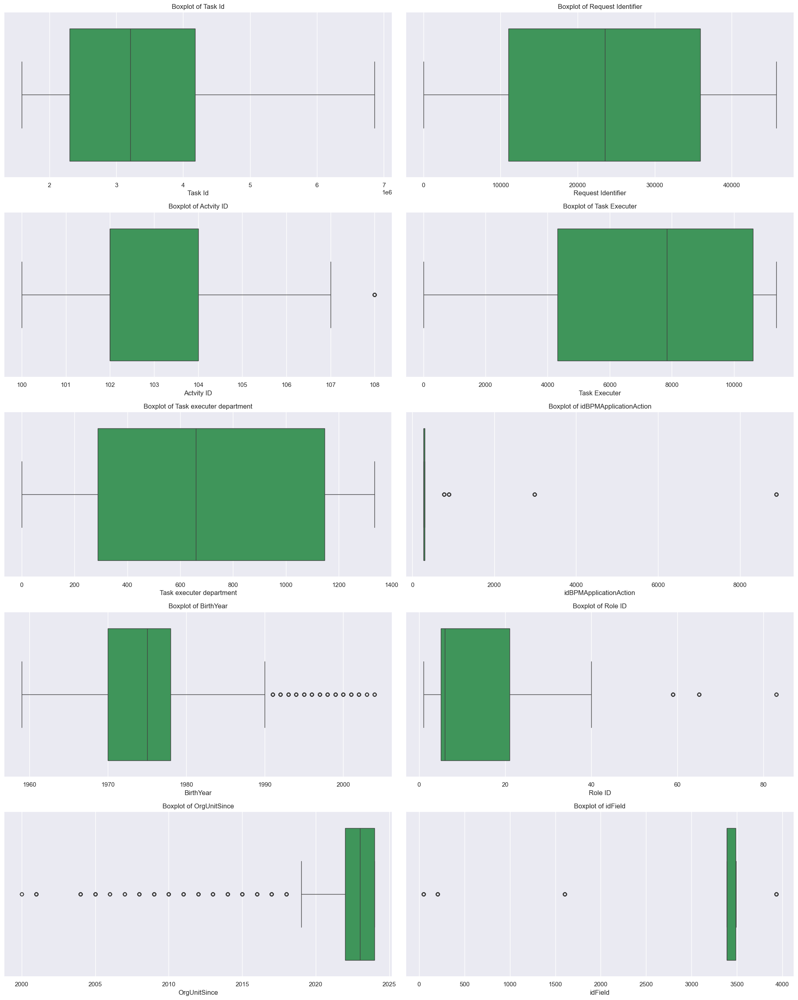

In [87]:
# Set seaborn style
sns.set()

# Calculate the number of rows and columns for the subplots
n_cols = 2
n_rows = ceil(len(numeric_columns) / n_cols)

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows))

# Flatten axes for easy iteration, in case there's only one row, adjust axes to be iterable
axes = axes.flatten() if n_rows > 1 else [axes]

# Plot boxplots for each numeric column
for ax, feat in zip(axes, numeric_columns):
    sns.boxplot(x=all_info[feat], ax=ax, color='#31a354')
    ax.set_title(f'Boxplot of {feat}')
    
# Remove any unused subplots
for i in range(len(numeric_columns), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

#### Z-Score Method

Identifies how far away a data point is from the mean of the data. Data points with a Z-score greater than a threshold (3, in our case) may be considered outliers.

In [88]:
# Z-Score method
outlier_counts_zscore = {}
for col in numeric_columns:
    col_zscore = (all_info[col] - all_info[col].mean()) / all_info[col].std()
    outlier_counts_zscore[col] = (np.abs(col_zscore) > 3).sum()

# Print outlier counts
print("Outlier counts using Z-Score method:")
for col, count in outlier_counts_zscore.items():
    print(f"{col}: {count}")

Outlier counts using Z-Score method:
Task Id: 0
Request Identifier: 0
Actvity ID: 0
Task Executer: 0
Task executer department: 0
idBPMApplicationAction: 121408
BirthYear: 40624
Role ID: 3858
OrgUnitSince: 28079
idField: 0


#### IQR Method

Measures the dispersion of the data points between the first and third quartile. Data points that fall outside the range defined by quartiles ± 1.5 * IQR may be considered outliers.

In [89]:
# IQR method
outlier_counts_iqr = {}
for col in numeric_columns:
    Q1 = all_info[col].quantile(0.25)
    Q3 = all_info[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outlier_counts_iqr[col] = ((all_info[col] < lower_bound) | (all_info[col] > upper_bound)).sum()

# Print outlier counts
print("Outlier counts using IQR method:")
for col, count in outlier_counts_iqr.items():
    print(f"{col}: {count}")

Outlier counts using IQR method:
Task Id: 0
Request Identifier: 0
Actvity ID: 4838
Task Executer: 0
Task executer department: 0
idBPMApplicationAction: 135820
BirthYear: 56261
Role ID: 3688
OrgUnitSince: 87304
idField: 339351


#### Isolation Forest Method

The Isolation Forest algorithm is an unsupervised outlier detection tool. It operates by isolating outliers as abnormalities in a random forest structure

In [90]:
# Isolation Forest method
outlier_counts_iso = {}
for col in numeric_columns:
    iso = IsolationForest(contamination=0.01, random_state=42)
    preds = iso.fit_predict(all_info[[col]])
    outlier_counts_iso[col] = (preds == -1).sum()

# Print outlier counts
print("Outlier counts using Isolation Forest method:")
for col, count in outlier_counts_iso.items():
    print(f"{col}: {count}")

Outlier counts using Isolation Forest method:
Task Id: 12164
Request Identifier: 12202
Actvity ID: 4838
Task Executer: 12207
Task executer department: 9237
idBPMApplicationAction: 3046
BirthYear: 11437
Role ID: 4111
OrgUnitSince: 7071
idField: 0


Analysing the outputs of the previous 4 methods, we crossed the results and identified the variables that appeared with outliers in at least 2 of them:
- 'Actvity ID' (will not be considered, since these are the actual activities, outlier concept doesn't make sense in this context)
- 'idBPMApplicationAction' (we decided not to remove outliers from ID variables)
- **'BirthYear' (will be later removed - adding variable age)**
- 'Role ID' (we decided not to remove outliers from ID variables)
- **'OrgUnitSince' - remove values below 2005, in order to keep as much data as possible (done bellow)**
- 'idField' (we decided not to remove outliers from ID variables)

### Oultiers Removal

- Looking at boxplot values

In [91]:
# Remove outliers with values below 2005
filtered_df = all_info[(all_info['OrgUnitSince'] >= 2005)]

# Calculate the percentage of data kept after removing outliers
percentage_data_kept = np.round(filtered_df.shape[0] / all_info.shape[0] * 100, 2)
print('Percentage of data kept after removing outliers:', percentage_data_kept)

Percentage of data kept after removing outliers: 99.93


In [92]:
all_info = filtered_df.copy()
all_info.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1251313 entries, 0 to 1252346
Data columns (total 21 columns):
 #   Column                    Non-Null Count    Dtype         
---  ------                    --------------    -----         
 0   Task Id                   1251313 non-null  int32         
 1   Request Identifier        1251313 non-null  int32         
 2   Task arrival date         1251313 non-null  datetime64[ns]
 3   Task capture date         1251313 non-null  datetime64[ns]
 4   Task execution end date   1251313 non-null  datetime64[ns]
 5   Task predicted end date   1251313 non-null  datetime64[ns]
 6   Actvity ID                1251313 non-null  int32         
 7   Task Executer             1251313 non-null  Int32         
 8   Task executer department  1251313 non-null  Int32         
 9   Task Type                 1251313 non-null  object        
 10  Action                    1251313 non-null  object        
 11  idBPMApplicationAction    1251313 non-null  int32      

## Incoherencies

- Max value of 'BirthYear' equal to 2050, verified before - no longer exists in the merged dataset, the user is not in this process.

#### Check if there are any robots or unknown genders

In [93]:
all_info[all_info['Sex']==' ']

,Task Id,Request Identifier,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Actvity ID,Task Executer,Task executer department,Task Type,Action,idBPMApplicationAction,Sex,BirthYear,Role ID,Is Manager,OrgUnitSince,IsOutSourcer,idField,Value,Rejections


In [94]:
all_info[all_info['Sex']=='U']

,Task Id,Request Identifier,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Actvity ID,Task Executer,Task executer department,Task Type,Action,idBPMApplicationAction,Sex,BirthYear,Role ID,Is Manager,OrgUnitSince,IsOutSourcer,idField,Value,Rejections


- There are no robots or unknown genders on our merged dataset, relative to this case process, as was previously referred by Millenium bcp. 

#### Check values like '2023-10-01T23:00:00.000Z' in 'Value'

Value of the field identified with idField.

In [95]:
all_info['idField'].unique()

array([1602,   47, 3486, 3491, 3388, 3391, 3420,  203, 1604, 3390, 3935])

In [96]:
all_info['Value'].unique()

array([1, 10, 20, '2022-04-10T23:00:00.000Z', 90,
       '2022-04-12T23:00:00.000Z', 70, 80, '2022-04-25T23:00:00.000Z',
       '2022-04-26T23:00:00.000Z', '2022-04-27T23:00:00.000Z',
       '2022-04-28T23:00:00.000Z', 50, '2022-05-01T23:00:00.000Z', 2, 40,
       60, 100, '2022-05-02T23:00:00.000Z', '2022-05-04T23:00:00.000Z',
       '2022-05-05T23:00:00.000Z', '2022-05-08T23:00:00.000Z',
       '2022-05-09T23:00:00.000Z', '2022-05-10T23:00:00.000Z',
       '2022-05-11T23:00:00.000Z', '2022-05-12T23:00:00.000Z', 30,
       '2022-05-15T23:00:00.000Z', '2022-05-17T23:00:00.000Z',
       '2022-05-22T23:00:00.000Z', '2022-05-19T23:00:00.000Z',
       '2022-05-23T23:00:00.000Z', '2022-05-25T23:00:00.000Z',
       '2022-05-26T23:00:00.000Z', '2022-05-29T23:00:00.000Z',
       '2022-05-30T23:00:00.000Z', '2022-06-05T23:00:00.000Z',
       '2022-06-06T23:00:00.000Z', '2022-06-07T23:00:00.000Z',
       '2022-06-08T23:00:00.000Z', '2022-06-13T23:00:00.000Z',
       '2022-06-14T23:00:00.000Z', '

- Will remove or not use the variable, can't find a logic.

## Visualizations

### Count occurrences of each 'Task Type'

In [97]:
# Counting occurrences of each Task Type
task_type_counts = all_info['Task Type'].value_counts().reset_index()
task_type_counts.columns = ['Task Type', 'Count']
print(task_type_counts)

                         Task Type   Count
0                        Execution  854330
1                  Initial Request  291813
2                       Final task   88590
3  Requester response to rejection   16580


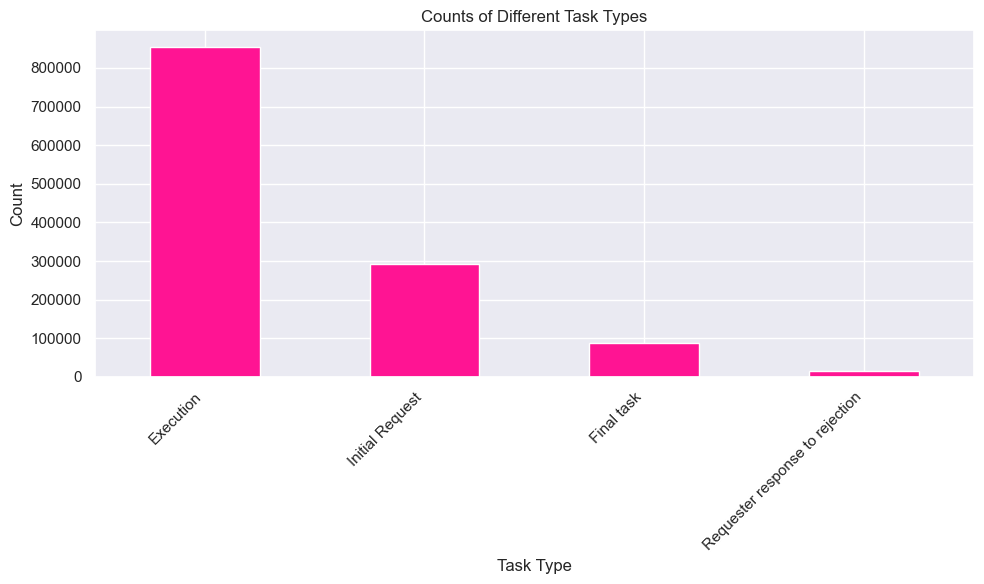

In [98]:
# Group by 'Task Type' and count occurrences
task_type_counts = all_info['Task Type'].value_counts()

# Plot the bar plot
plt.figure(figsize=(10, 6))
task_type_counts.plot(kind='bar', color='deeppink')
plt.title('Counts of Different Task Types')
plt.xlabel('Task Type')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

The most occurring task is ‘Execution’, followed by ‘Initial Request’, then ‘Final task’ and, lastly, ‘Requester response to rejection’ 

### Count occurrences of each 'Action'

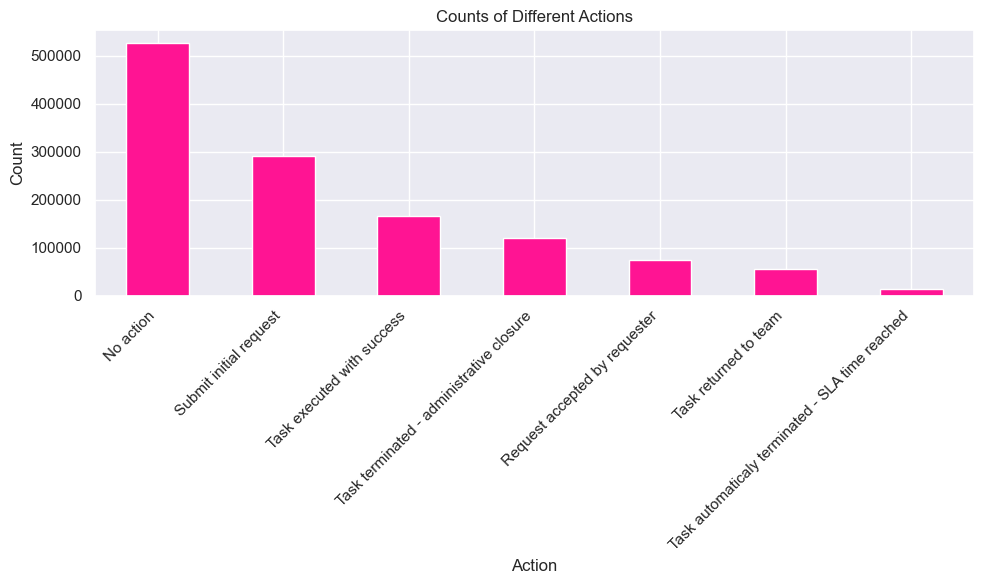

In [99]:
# Group by 'Action' and count occurrences
action_counts = all_info['Action'].value_counts()

# Plot the bar plot
plt.figure(figsize=(10, 6))
action_counts.plot(kind='bar', color='deeppink')
plt.title('Counts of Different Actions')
plt.xlabel('Action')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### Distribution of 'Rejections' per 'Actvity ID'

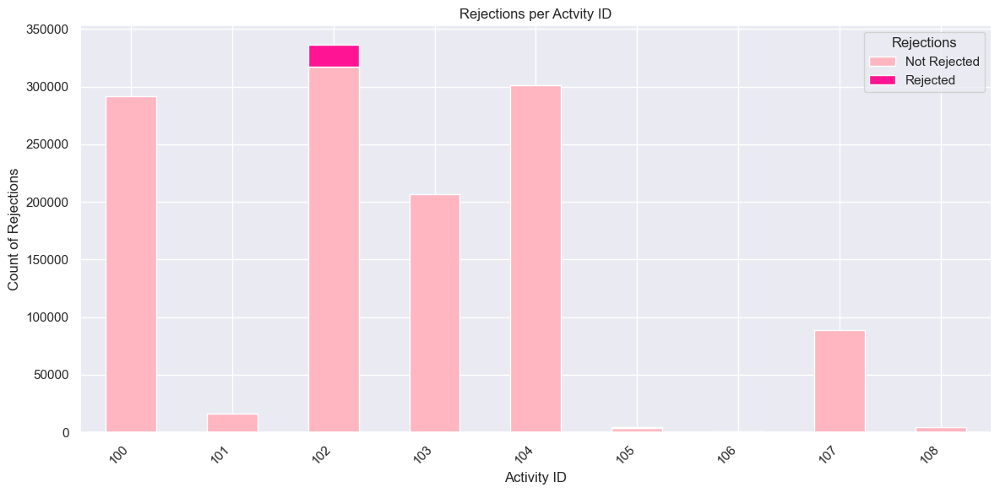

In [100]:
# Group by 'Actvity ID' and 'Rejections', count occurrences
requirement_counts = all_info.groupby(['Actvity ID', 'Rejections']).size().unstack()

# Plot the bar plot with custom colors
requirement_counts.plot(kind='bar', stacked=True, figsize=(12, 6), color=['lightpink', 'deeppink'])
plt.title('Rejections per Actvity ID')
plt.xlabel('Activity ID')
plt.ylabel('Count of Rejections')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Rejections', labels=['Not Rejected', 'Rejected'])
plt.tight_layout()
plt.show()

### Count occurrences of each 'Actvity ID'

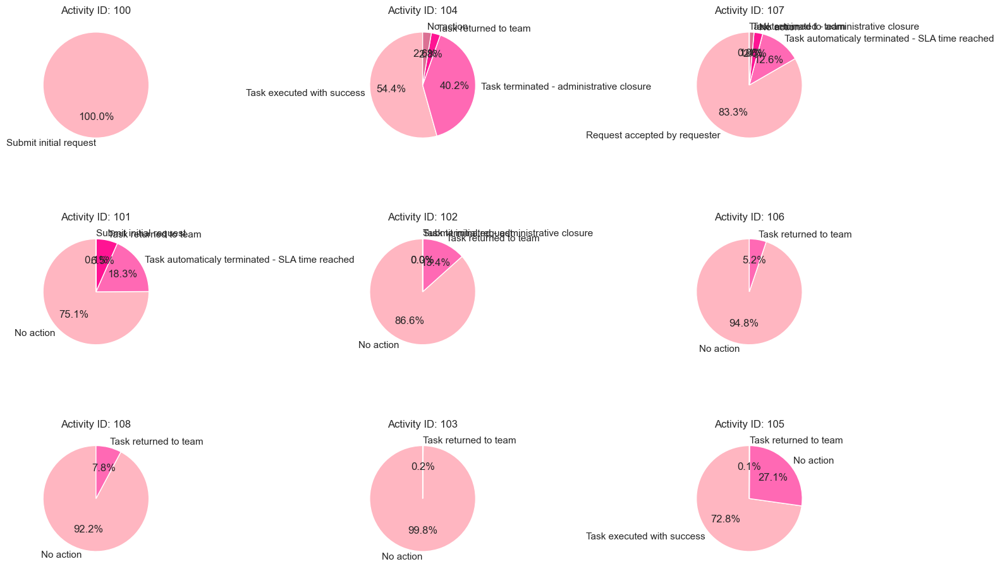

In [101]:
# Custom color palette with shades of pink
custom_colors = ['#FFB6C1', '#FF69B4', '#FF1493', '#DB7093', '#C71585', '#FFC0CB']

# Get unique activity IDs
activity_ids = all_info['Actvity ID'].unique()

# Define the number of columns and rows for subplots
num_cols = 3  # Number of columns in the subplot grid
num_rows = (len(activity_ids) + num_cols - 1) // num_cols  # Number of rows needed

# Create subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 10))

# Flatten the axs array if needed
if num_rows == 1:
    axs = axs.reshape(-1)  # Flatten to 1D array
else:
    axs = axs.flatten()

# Iterate over each activity ID
for i, activity_id in enumerate(activity_ids):
    # Filter data for the current activity
    activity_data = all_info[all_info['Actvity ID'] == activity_id]
    
    # Group by action and count occurrences
    action_counts = activity_data['Action'].value_counts()
    
    # Plot pie chart for the current activity with custom colors
    ax = axs[i]  # Get the corresponding subplot
    ax.pie(action_counts, labels=action_counts.index, autopct='%1.1f%%', startangle=90, colors=custom_colors)
    ax.set_title(f'Activity ID: {activity_id}')
    
# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

- Activity ID 100: Every instance of this activity successfully submits an initial request, indicating 100% efficiency at this stage.
- Activity ID 101: Most cases (75.1%) have no action, while 18.3% end with the task being automatically terminated due to SLA being reached, indicating potential delays or issues.
- Activity ID 104: Shows a majority split between administrative closures and successful completions.
- Activity ID 106 and 107: Highlight frequent returns to the team and inactions, respectively, suggesting these stages might be bottlenecks or inefficient points within the process.

The activity that occurs that most is 102, associated with different actions, for instance, administrative closure and tasks that were returned to the team. This activity is also the one related to the existence of rejections.

### Rejections by Outsourcer

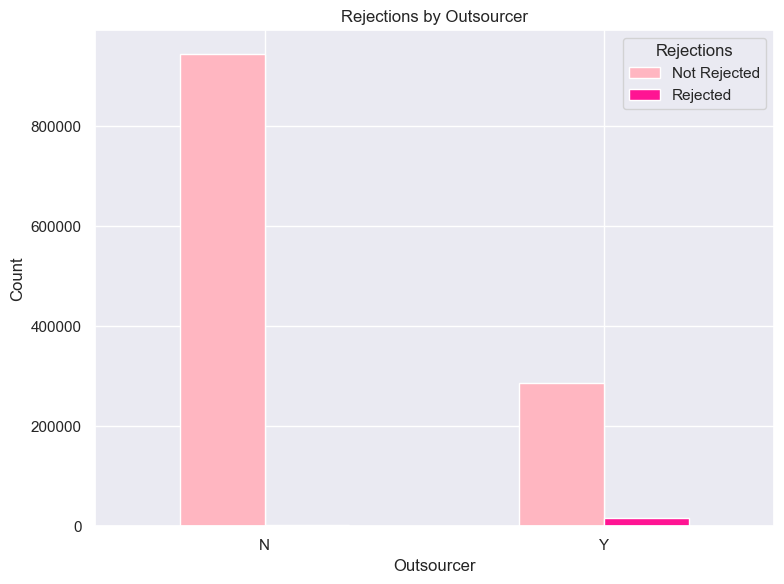

In [102]:
# Group by 'IsOutSourcer' and 'Rejections', count occurrences
outsourcer_rejection_counts = all_info.groupby(['IsOutSourcer', 'Rejections']).size().unstack()

# Plot the grouped bar plot
outsourcer_rejection_counts.plot(kind='bar', stacked=False, figsize=(8, 6), color=['lightpink', 'deeppink'])
plt.title('Rejections by Outsourcer')
plt.xlabel('Outsourcer')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.legend(title='Rejections', labels=['Not Rejected', 'Rejected'])
plt.tight_layout()
plt.show()

### Rejections by Manager

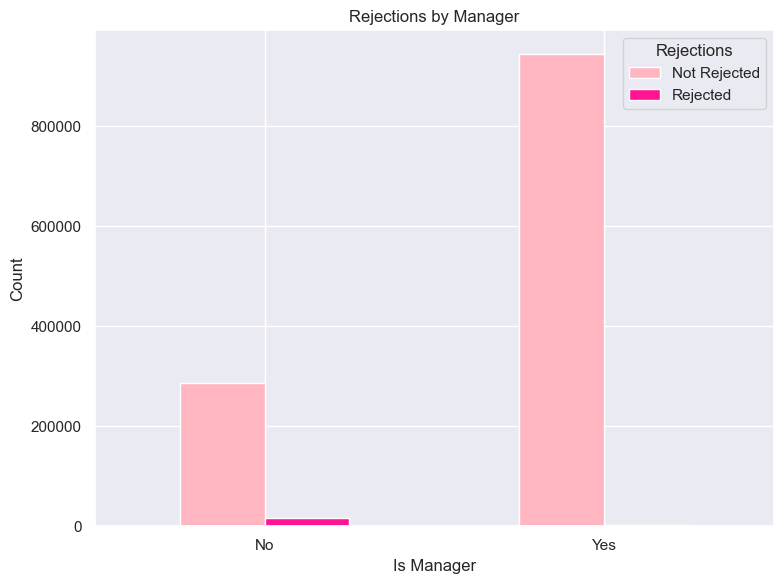

In [103]:
# Group by 'IsOutSourcer' and 'Rejections', count occurrences
outsourcer_rejection_counts = all_info.groupby(['Is Manager', 'Rejections']).size().unstack()

# Plot the grouped bar plot
outsourcer_rejection_counts.plot(kind='bar', stacked=False, figsize=(8, 6), color=['lightpink', 'deeppink'])
plt.title('Rejections by Manager')
plt.xlabel('Is Manager')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.legend(title='Rejections', labels=['Not Rejected', 'Rejected'])
plt.tight_layout()
plt.show()

Most of the users are not outsourcers and are considered managers. The ones that are not managers and not outsourcers are related to the cases that were rejected.

### Correlation Matrix

In [104]:
# Select only the numeric columns
numeric_columns = all_info.select_dtypes(include=['int32', 'Int32'])

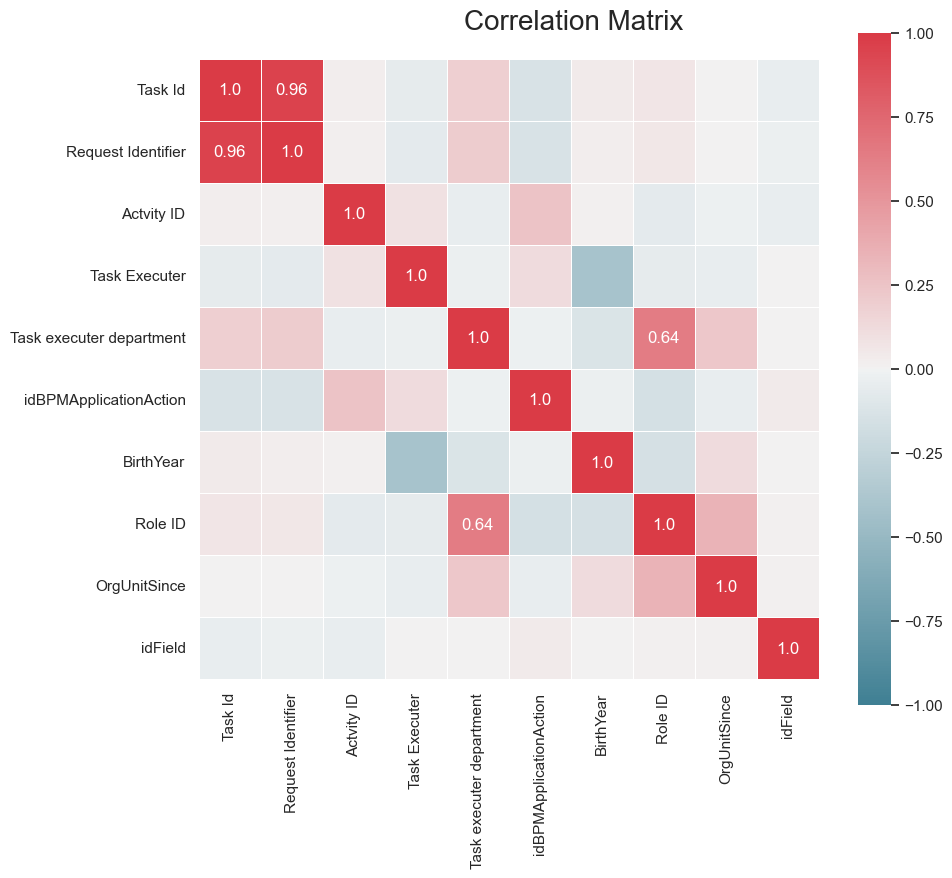

In [105]:
# Prepare figure
fig = plt.figure(figsize=(10, 8))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = np.round(numeric_columns.corr(method="pearson"), decimals=2)

# Build annotation matrix (values above |0.5| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.5
annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

##### Analyse 'Task Id' and 'Request Identifier'

In [106]:
subset_all_info = all_info[['Task Id', 'Request Identifier']]
subset_all_info

,Task Id,Request Identifier
0,1584303,1
1,1584303,1
2,1584303,1
3,1584303,1
4,1584303,1
...,...,...
1252342,6842012,37077
1252343,6842012,37077
1252344,6842012,37077
1252345,6842012,37077


In [107]:
subset_all_info.duplicated().sum()

1062576

In [108]:
# Group by 'Task Id' and count unique 'Request Identifier'
task_request_counts = all_info.groupby('Task Id')['Request Identifier'].nunique()

# Filter task ids with more than one unique request identifier
task_ids_with_multiple_requests = task_request_counts[task_request_counts > 1]

# Check if there are any task ids with multiple request identifiers
if not task_ids_with_multiple_requests.empty:
    print("Yes, there are Task Ids that correspond to more than one Request Identifier:")
    print(task_ids_with_multiple_requests)
else:
    print("No, there are no Task Ids that correspond to more than one Request Identifier.")

No, there are no Task Ids that correspond to more than one Request Identifier.


In [109]:
# Group by 'Request Identifier' and count unique 'Task Id'
request_task_counts = all_info.groupby('Request Identifier')['Task Id'].nunique()

# Filter request identifiers with more than one unique task id
request_identifiers_with_multiple_tasks = request_task_counts[request_task_counts > 1]

# Check if there are any request identifiers with multiple task ids
if not request_identifiers_with_multiple_tasks.empty:
    print("Yes, there are Request Identifiers that correspond to more than one Task Id:")
    print(request_identifiers_with_multiple_tasks)
else:
    print("No, there are no Request Identifiers that correspond to more than one Task Id.")

Yes, there are Request Identifiers that correspond to more than one Task Id:
Request Identifier
1        5
2        5
3        2
4        3
5        5
        ..
45768    5
45769    5
45770    5
45771    4
45772    6
Name: Task Id, Length: 45581, dtype: int64


- 'Task Id' and 'Request Identifier' are highly correlated, we can possibly remove one. The one to be removed should be 'Task Id', since 'Request Identifier' is our ID for the case in general. (Removed on feature selection)

###  Directly-Follows Graphs (DFG) by 'Action'

Using 'Request Identifier' as CaseID, 'Task execution end date' as Timestamp and 'Action' as Activity

In [110]:
# Sort the dataframe by 'Request Identifier' and 'Task execution end date'
all_info = all_info.sort_values(by=['Request Identifier', 'Task execution end date'])

In [111]:
# Initialize an empty list to store the directly-follows relationships
directly_follows = []

# Iterate over each Request Identifier (CaseID)
for case_id, group in all_info.groupby('Request Identifier'):
    # Get the list of activities for the current case
    activities = group['Action'].tolist()
    
    # Generate (current_activity, next_activity) pairs
    for i in range(len(activities) - 1):
        directly_follows.append((activities[i], activities[i + 1]))

# Convert the list to a DataFrame
df_follows = pd.DataFrame(directly_follows, columns=['From', 'To'])

# Count the occurrences of each directly-follows relationship
df_follows_count = df_follows.value_counts().reset_index(name='Count')
# print(df_follows_count)
df_follows_count

,From,To,Count
0,No action,No action,481148
1,Submit initial request,Submit initial request,246976
2,Task executed with success,Task executed with success,142887
3,Task terminated - administrative closure,Task terminated - administrative closure,101688
4,Request accepted by requester,Request accepted by requester,64835
5,Task returned to team,Task returned to team,50531
6,Submit initial request,No action,39997
7,No action,Task executed with success,22996
8,No action,Task terminated - administrative closure,18426
9,Task automaticaly terminated - SLA time reached,Task automaticaly terminated - SLA time reached,11718


In [112]:
df_follows_count.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28 entries, 0 to 27
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   From    28 non-null     object
 1   To      28 non-null     object
 2   Count   28 non-null     int64 
dtypes: int64(1), object(2)
memory usage: 804.0+ bytes


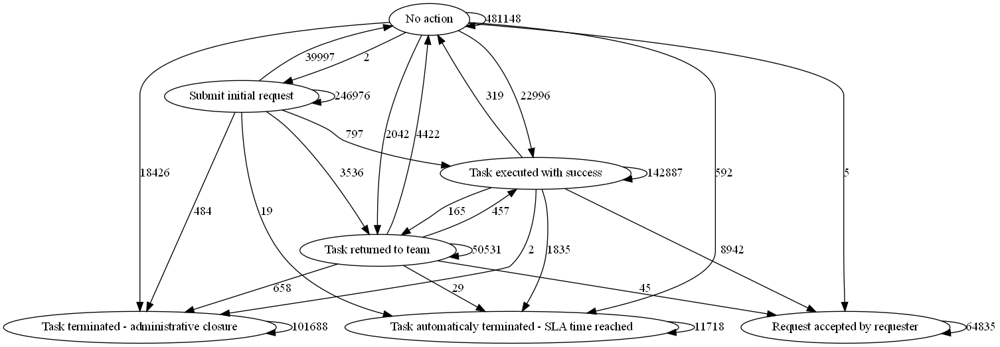

In [113]:
# Create a new directed graph
dot = Digraph()

# Add nodes and edges to the graph
for _, row in df_follows_count.iterrows():
    from_activity = row['From']
    to_activity = row['To']
    count = row['Count']
    
    # Add nodes (activities)
    dot.node(from_activity, from_activity)
    dot.node(to_activity, to_activity)
    
    # Add edges with labels showing the count
    dot.edge(from_activity, to_activity, label=str(count))

# Render the graph to a file and display it inline
output_file_path = 'directly_follows_graph'
dot.render(output_file_path, format='png')

# Display the image inline
display(Image(filename=output_file_path + '.png'))

It can be seen that there are three final actions, from which there are no arrows coming out, just coming in (expect the ones looping in that same action): “Task terminated – administrative closure”, “Task automatically terminated – SLA time reached” and “Request accepted by requester”.  Tasks that either leave the stage of being returned to the team or that were executed successfully can end up in any of those three final actions mentioned. An action that can lead also to administrative closure or to an automatically terminated task (SLA time reached) is the submition of an initial request.

###  Directly-Follows Graphs (DFG) by 'ActviTy ID'

Using 'Request Identifier' as CaseID, 'Task execution end date' as Timestamp and 'Actvity ID' as Activity

In [114]:
# Sort by Request Identifier and Task capture date to ensure correct sequence
all_info = all_info.sort_values(by=['Request Identifier', 'Task capture date'])

In [115]:
# Create a new DataFrame to store directly-follows relationships
df_follows = pd.DataFrame(columns=['From', 'To', 'Count'])

# Iterate over each Request Identifier (CaseID)
for case_id, group in all_info.groupby('Request Identifier'):
    # Get the list of activities (Actvity ID) for the current case in order
    activities = group['Actvity ID'].tolist()
    
    # Create directly-follows relationships
    for i in range(len(activities) - 1):
        from_activity = activities[i]
        to_activity = activities[i + 1]
        
        # Check if the relationship already exists in the DataFrame
        existing_row = df_follows[(df_follows['From'] == from_activity) & (df_follows['To'] == to_activity)]
        
        if not existing_row.empty:
            # If it exists, increment the count
            df_follows.loc[existing_row.index, 'Count'] += 1
        else:
            # If it doesn't exist, create a new row
            new_row = pd.DataFrame({'From': [from_activity], 'To': [to_activity], 'Count': [1]})
            df_follows = pd.concat([df_follows, new_row], ignore_index=True)

In [116]:
df_follows

,From,To,Count
0,100,100,246960
1,100,102,40368
2,102,102,291747
3,102,103,27378
4,103,103,175761
5,103,104,30586
6,104,104,257043
7,104,107,10804
8,107,107,77314
9,100,103,2793


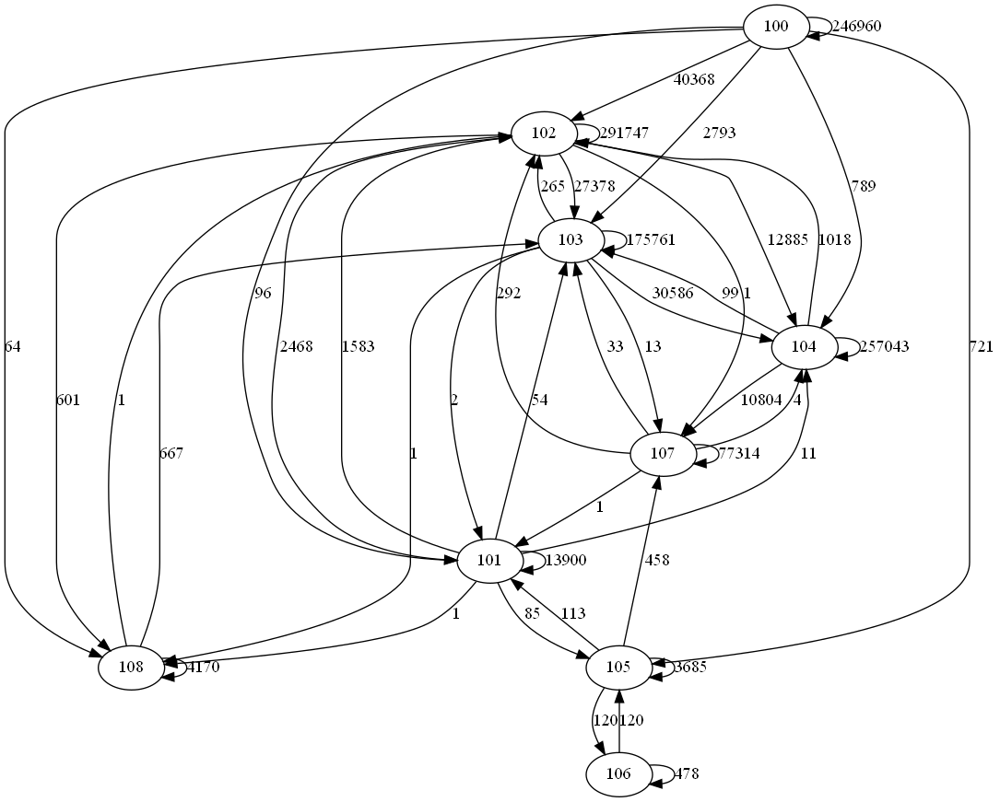

In [117]:
# Create a new directed graph
dot = Digraph()

# Add nodes and edges to the graph
for _, row in df_follows.iterrows():
    from_activity = str(row['From'])  # Convert to string for node labels
    to_activity = str(row['To'])      # Convert to string for node labels
    count = row['Count']
    
    # Add nodes (activities)
    dot.node(from_activity, from_activity)
    dot.node(to_activity, to_activity)
    
    # Add edges with labels showing the count
    dot.edge(from_activity, to_activity, label=str(count))

# Render the graph to a file and display it inline
output_file_path = 'directly_follows_graph'
dot.render(output_file_path, format='png')

# Display the image inline
display(Image(filename=output_file_path + '.png'))

The numbers on the paths represent the frequency of transitions from one activity to another, highlighting the most common paths and bottlenecks within the process. Activities like ID 100 and 104 have high frequencies, indicating they are common steps, while the transitions to activities like ID 107 show critical junctures where decisions or significant actions occur.
The most clear insight is that activity 100 is always a starting point, since there are arrows only pointing outside (expept the loop).

## Feature Engineering

### Extract Month and Year from Task arrival date

In [118]:
# Example: Extract year and month from the 'Task arrival date'
all_info['Year'] = all_info['Task arrival date'].dt.year
all_info['Month'] = all_info['Task arrival date'].dt.month
all_info.head()

,Task Id,Request Identifier,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Actvity ID,Task Executer,Task executer department,Task Type,Action,idBPMApplicationAction,Sex,BirthYear,Role ID,Is Manager,OrgUnitSince,IsOutSourcer,idField,Value,Rejections,Year,Month
0,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,100,7638,569,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,1602,1,0,2022,4
1,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,100,7638,569,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,47,1,0,2022,4
2,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,100,7638,569,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,3486,10,0,2022,4
3,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,100,7638,569,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,3491,10,0,2022,4
4,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,100,7638,569,Initial Request,Submit initial request,270,M,1967,5,Yes,2021,N,3388,10,0,2022,4


### Create variable Age

In [119]:
# Step 1: Get the current year
current_year = datetime.now().year

# Step 2: Calculate the age
all_info['Age'] = current_year - all_info['BirthYear']

all_info.drop(columns=['BirthYear'], inplace=True)
print(all_info.head())

   Task Id  Request Identifier       Task arrival date  \
0  1584303                   1 2022-04-11 16:02:13.820   
1  1584303                   1 2022-04-11 16:02:13.820   
2  1584303                   1 2022-04-11 16:02:13.820   
3  1584303                   1 2022-04-11 16:02:13.820   
4  1584303                   1 2022-04-11 16:02:13.820   

        Task capture date Task execution end date Task predicted end date  \
0 2022-04-11 16:02:13.820 2022-04-11 16:02:13.820 2022-04-11 16:02:13.820   
1 2022-04-11 16:02:13.820 2022-04-11 16:02:13.820 2022-04-11 16:02:13.820   
2 2022-04-11 16:02:13.820 2022-04-11 16:02:13.820 2022-04-11 16:02:13.820   
3 2022-04-11 16:02:13.820 2022-04-11 16:02:13.820 2022-04-11 16:02:13.820   
4 2022-04-11 16:02:13.820 2022-04-11 16:02:13.820 2022-04-11 16:02:13.820   

   Actvity ID  Task Executer  Task executer department        Task Type  \
0         100           7638                       569  Initial Request   
1         100           7638          

### Create variable Time Difference

Variable created from the difference between 'Task execution end date' and 'Task arrival date'.

In [120]:
all_info['Time Difference'] = (all_info['Task execution end date'] - all_info['Task arrival date']).dt.days

In [121]:
all_info['Time Difference'].unique()

array([  0,  28,   7,   8,  18,   1, 499,  15, 512,  14,  24, 487,  54,
         5, 521, 526,  13,   3,   2,  34, 522,   9,  31, 480,  44,  42,
       474,  16,  10,   6,  12,  11,  30,   4,  20, 505, 504, 506,  33,
       472, 496,  25,  80, 234,  32, 498,  88, 416, 389, 109, 495, 494,
        47, 449, 491, 180, 497,  65, 439, 437, 489, 386,  86,  26, 500,
       492, 488, 387, 107, 385, 108, 284,  53, 447, 116, 121,  83, 478,
       493,  27,  77, 407,  17, 476, 186,  38, 460, 461, 424, 490,  87,
        36, 227,  23,  49, 444, 384,  46,  75, 417, 484,  22,  29, 485,
       483,  59, 410,  91, 400, 318, 486,  19, 369,  82, 479, 473, 471,
        81, 466,  76,  72, 282,  55, 458, 462,  41, 445,  21, 464, 482,
       220, 438, 427,  51, 477,  84, 409, 408,  40, 404,  43, 475, 174,
       406, 446, 470, 354,  68,  89, 371,  56, 469,  85, 396,  66, 331,
       459, 465, 457, 288, 463, 456,  67, 332,  60,  62, 231, 115, 343,
        70, 412,  74, 415,  73, 397,  61, 333, 250, 335, 146,  4

### Replace 'F' with 0 and 'M' with 1 in 'Sex'

In [122]:
all_info['Sex'] = all_info['Sex'].replace({'F': 0, 'M': 1})

### Replace 'No' with 0 and 'Yes' with 1 in 'Is Manager'

In [123]:
all_info['Is Manager'].unique()

array(['Yes', 'No'], dtype=object)

In [124]:
all_info['Is Manager'] = all_info['Is Manager'].replace({'Yes': 1, 'No': 0})

### Replace 'Y' with 1 and 'N' with 0 in 'IsOutSourcer'

In [125]:
all_info['IsOutSourcer'].unique()

array(['N', 'Y'], dtype=object)

In [126]:
all_info['IsOutSourcer'] = all_info['IsOutSourcer'].replace({'Y': 1, 'N': 0})

### Replace values of 'Task Type' by 0,1,2 and 3

In [127]:
all_info['Task Type'].unique()

array(['Initial Request', 'Execution', 'Final task',
       'Requester response to rejection'], dtype=object)

In [128]:
all_info['Task Type'] = all_info['Task Type'].replace({'Initial Request': 0, 'Execution':1, 'Final task':2,
       'Requester response to rejection':3})

### Replace values of 'Action' by 0,1,2,3,4, 5 and 6

In [129]:
all_info['Action'].unique()

array(['Submit initial request', 'No action',
       'Task executed with success', 'Request accepted by requester',
       'Task returned to team',
       'Task terminated - administrative closure',
       'Task automaticaly terminated - SLA time reached'], dtype=object)

In [130]:
all_info['Action'] = all_info['Action'].replace({'Submit initial request':0, 'Task executed with success':1,
       'Task automaticaly terminated - SLA time reached':2,
       'Request accepted by requester':3,
       'Task terminated - administrative closure':4,
       'Task returned to team':5,'No action':6})

In [131]:
all_info

,Task Id,Request Identifier,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Actvity ID,Task Executer,Task executer department,Task Type,Action,idBPMApplicationAction,Sex,Role ID,Is Manager,OrgUnitSince,IsOutSourcer,idField,Value,Rejections,Year,Month,Age,Time Difference
0,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,100,7638,569,0,0,270,1,5,1,2021,0,1602,1,0,2022,4,57,0
1,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,100,7638,569,0,0,270,1,5,1,2021,0,47,1,0,2022,4,57,0
2,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,100,7638,569,0,0,270,1,5,1,2021,0,3486,10,0,2022,4,57,0
3,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,100,7638,569,0,0,270,1,5,1,2021,0,3491,10,0,2022,4,57,0
4,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,100,7638,569,0,0,270,1,5,1,2021,0,3388,10,0,2022,4,57,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1157579,6863412,45772,2024-05-07 08:31:29.010,2024-05-07 08:50:29.990,2024-05-07 08:50:59.667,2024-05-13 12:31:29.097,107,2243,722,2,3,299,0,4,1,2023,0,203,2024-05-01T23:00:00.000Z,0,2024,5,25,0
1157580,6863412,45772,2024-05-07 08:31:29.010,2024-05-07 08:50:29.990,2024-05-07 08:50:59.667,2024-05-13 12:31:29.097,107,2243,722,2,3,299,0,4,1,2023,0,3486,30,0,2024,5,25,0
1157581,6863412,45772,2024-05-07 08:31:29.010,2024-05-07 08:50:29.990,2024-05-07 08:50:59.667,2024-05-13 12:31:29.097,107,2243,722,2,3,299,0,4,1,2023,0,3388,50,0,2024,5,25,0
1157582,6863412,45772,2024-05-07 08:31:29.010,2024-05-07 08:50:29.990,2024-05-07 08:50:59.667,2024-05-13 12:31:29.097,107,2243,722,2,3,299,0,4,1,2023,0,3390,50,0,2024,5,25,0


In [132]:
all_info.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1251313 entries, 0 to 1157583
Data columns (total 24 columns):
 #   Column                    Non-Null Count    Dtype         
---  ------                    --------------    -----         
 0   Task Id                   1251313 non-null  int32         
 1   Request Identifier        1251313 non-null  int32         
 2   Task arrival date         1251313 non-null  datetime64[ns]
 3   Task capture date         1251313 non-null  datetime64[ns]
 4   Task execution end date   1251313 non-null  datetime64[ns]
 5   Task predicted end date   1251313 non-null  datetime64[ns]
 6   Actvity ID                1251313 non-null  int32         
 7   Task Executer             1251313 non-null  Int32         
 8   Task executer department  1251313 non-null  Int32         
 9   Task Type                 1251313 non-null  int64         
 10  Action                    1251313 non-null  int64         
 11  idBPMApplicationAction    1251313 non-null  int32      

Correct data types of the categorical variables engineered before:

In [133]:
all_info['Sex'] = all_info['Sex'].astype('object')
all_info['Action'] = all_info['Action'].astype('object')
all_info['Is Manager'] = all_info['Is Manager'].astype('object')
all_info['IsOutSourcer'] = all_info['IsOutSourcer'].astype('object')
all_info['Task Type'] = all_info['Task Type'].astype('object')

In [134]:
all_info.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1251313 entries, 0 to 1157583
Data columns (total 24 columns):
 #   Column                    Non-Null Count    Dtype         
---  ------                    --------------    -----         
 0   Task Id                   1251313 non-null  int32         
 1   Request Identifier        1251313 non-null  int32         
 2   Task arrival date         1251313 non-null  datetime64[ns]
 3   Task capture date         1251313 non-null  datetime64[ns]
 4   Task execution end date   1251313 non-null  datetime64[ns]
 5   Task predicted end date   1251313 non-null  datetime64[ns]
 6   Actvity ID                1251313 non-null  int32         
 7   Task Executer             1251313 non-null  Int32         
 8   Task executer department  1251313 non-null  Int32         
 9   Task Type                 1251313 non-null  object        
 10  Action                    1251313 non-null  object        
 11  idBPMApplicationAction    1251313 non-null  int32      

### Define Target variable

The target variable was defined upon the analyse of the process map, using 'Actvity ID' and 'idBPMApplicationAction', looking at the ending of the processes (registered the activities and action codes existent right before arriving to the 4 outputs).

In [135]:
# Define the logic for the target variable
def determine_target(row):
    if row['Actvity ID'] == 103 and row['idBPMApplicationAction'] in [8888, 888]:
        return 'Closed administratively'
    elif row['Actvity ID'] == 108 and row['idBPMApplicationAction'] in [8888, 888]:
        return 'Closed administratively'
    elif row['Actvity ID'] == 106 and row['idBPMApplicationAction'] in [8888, 888]:
        return 'Closed administratively'
    elif row['Actvity ID'] == 107 and row['idBPMApplicationAction'] in [8888, 888]:
        return 'Closed administratively'
    elif row['Actvity ID'] == 101 and row['idBPMApplicationAction'] in [2981, 298]:
        return 'Request canceled'
    elif row['Actvity ID'] == 107 and row['idBPMApplicationAction'] == 299:
        return 'Request finished'
    elif row['Actvity ID'] == 104:
        return 'Closed administratively/Requester rejects accounting impact'
    else:
        return 'Unknown'

# Sort the DataFrame by 'Request Identifier' and 'Task arrival date'
all_info = all_info.sort_values(by=['Request Identifier', 'Task arrival date'])

# Group by 'Request Identifier' and get the last row in each group
last_activity = all_info.groupby('Request Identifier').tail(1).copy()

# Apply the logic to determine the target for the last activity in each request
last_activity.loc[:, 'Target'] = last_activity.apply(determine_target, axis=1)

# Merge the target back to the original dataframe
all_info = all_info.merge(last_activity[['Request Identifier', 'Target']], on='Request Identifier', how='left', suffixes=('', '_last'))
#print(all_info.columns)

In [136]:
# Sorting by 'Request Identifier' and 'Task arrival date'
all_info = all_info.sort_values(by=['Request Identifier', 'Task arrival date'])

# Grouping by 'Request Identifier' and getting the last row of each group
last_activity = all_info.groupby('Request Identifier').tail(1).reset_index(drop=True)

# Displaying the resulting DataFrame
print("Last activity of each 'Request Identifier':")
last_activity

Last activity of each 'Request Identifier':


,Task Id,Request Identifier,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Actvity ID,Task Executer,Task executer department,Task Type,Action,idBPMApplicationAction,Sex,Role ID,Is Manager,OrgUnitSince,IsOutSourcer,idField,Value,Rejections,Year,Month,Age,Time Difference,Target
0,1671448,1,2022-05-10 13:43:32.627,2022-05-10 13:47:53.570,2022-05-10 13:48:44.353,2022-05-17 08:43:32.737,107,7638,569,2,3,299,1,5,1,2021,0,1604,90,0,2022,5,57,0,Request finished
1,1587689,2,2022-04-12 14:18:36.880,2022-04-12 14:21:47.677,2022-04-12 14:23:32.340,2022-04-20 09:18:36.940,107,598,606,2,3,299,0,5,1,2023,0,203,2022-04-11T23:00:00.000Z,0,2022,4,45,0,Request finished
2,1589362,3,2022-04-12 18:09:29.607,2022-04-13 13:16:14.933,2022-04-13 13:16:14.933,2022-04-13 15:30:00.690,102,11029,167,1,6,298,0,5,1,2021,0,3486,30,0,2022,4,49,0,Unknown
3,1606251,4,2022-04-20 15:02:55.713,2022-04-21 09:45:54.533,2022-04-21 11:54:31.433,2022-04-13 15:30:00.377,102,507,1336,1,6,271,1,11,1,2017,0,203,2022-04-12T23:00:00.000Z,1,2022,4,44,0,Unknown
4,1674202,5,2022-05-11 09:27:02.670,2022-05-11 09:28:06.237,2023-09-22 14:48:00.000,2022-05-11 16:27:02.757,104,8601,167,1,4,8888,1,5,1,2021,0,3486,30,0,2022,5,58,499,Closed administratively/Requester rejects acco...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45755,6649810,45768,2024-04-03 11:58:07.320,2024-04-09 15:31:52.430,2024-04-09 15:32:39.060,2024-04-04 09:58:07.387,104,10942,453,1,1,282,0,6,1,2023,0,3391,70,0,2024,4,52,6,Closed administratively/Requester rejects acco...
45756,6633736,45769,2024-04-01 16:30:56.657,2024-04-02 11:14:06.447,2024-04-02 11:34:06.210,2024-04-02 08:42:53.370,104,9549,347,1,1,282,1,5,1,2024,0,3391,70,0,2024,4,54,0,Closed administratively/Requester rejects acco...
45757,6631830,45770,2024-04-01 14:31:21.200,2024-04-01 14:31:42.607,2024-04-01 14:32:14.160,2024-04-08 09:31:21.233,107,7351,585,2,3,299,1,4,1,2022,0,3391,60,0,2024,4,60,0,Request finished
45758,6729661,45771,2024-04-16 09:15:42.380,2024-04-16 09:19:19.753,2024-04-16 09:20:08.637,2024-04-22 13:15:42.443,107,7945,478,2,3,299,1,4,1,2023,0,1604,90,0,2024,4,58,0,Request finished


In [137]:
last_activity.describe(include=['object'])

,Task Type,Action,Sex,Is Manager,IsOutSourcer,Value,Rejections,Target
count,45760,45760,45760,45760,45760,45760,45760,45760
unique,4,7,2,2,2,98,2,5
top,1,4,0,1,0,70,0,Closed administratively/Requester rejects acco...
freq,33846,19586,27024,44945,44945,18715,44966,32372


#### Visualize frequency of each 'Target' value  

In [138]:
# Count frequency of each target value
target_counts = last_activity['Target'].value_counts()

# Display the frequency of each target value
print("Frequency of each target value:")
print(target_counts)

Frequency of each target value:
Target
Closed administratively/Requester rejects accounting impact    32372
Request finished                                                8992
Closed administratively                                         1858
Unknown                                                         1667
Request canceled                                                 871
Name: count, dtype: int64


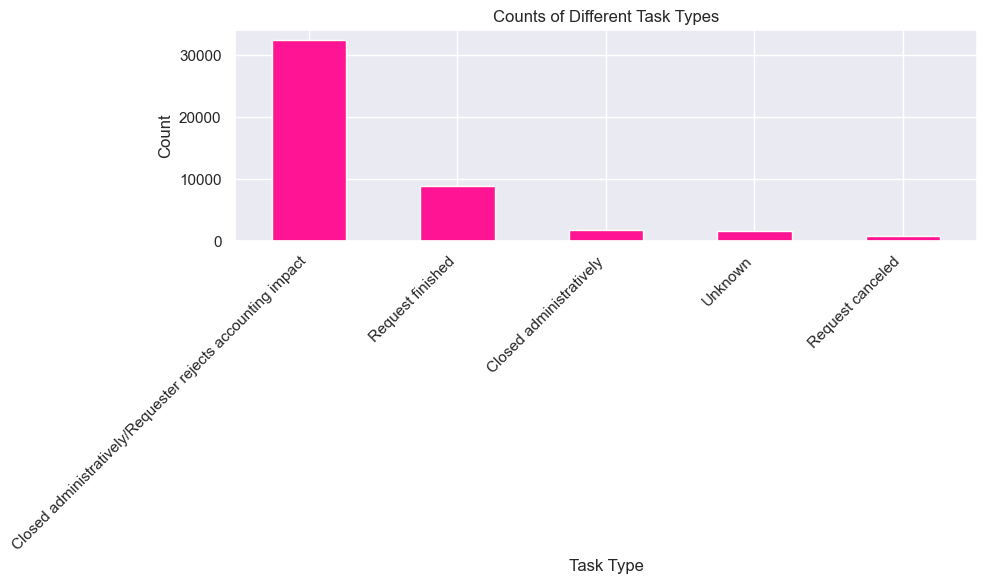

In [139]:
# Group by 'Task Type' and count occurrences
task_type_counts = last_activity['Target'].value_counts()

# Plot the bar plot
plt.figure(figsize=(10, 6))
task_type_counts.plot(kind='bar', color='deeppink')
plt.title('Counts of Different Task Types')
plt.xlabel('Task Type')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Closed administratively/Requester rejects accounting impact - most frequent target.

#### Analyse unknown targets

In [140]:
# Filter rows where the target is 'Unknown'
unknown_rows = last_activity[last_activity['Target'] == 'Unknown']

# Display the rows where the target is 'Unknown'
print("Rows where the target is 'Unknown':")
unknown_rows

Rows where the target is 'Unknown':


,Task Id,Request Identifier,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Actvity ID,Task Executer,Task executer department,Task Type,Action,idBPMApplicationAction,Sex,Role ID,Is Manager,OrgUnitSince,IsOutSourcer,idField,Value,Rejections,Year,Month,Age,Time Difference,Target
2,1589362,3,2022-04-12 18:09:29.607,2022-04-13 13:16:14.933,2022-04-13 13:16:14.933,2022-04-13 15:30:00.690,102,11029,167,1,6,298,0,5,1,2021,0,3486,30,0,2022,4,49,0,Unknown
3,1606251,4,2022-04-20 15:02:55.713,2022-04-21 09:45:54.533,2022-04-21 11:54:31.433,2022-04-13 15:30:00.377,102,507,1336,1,6,271,1,11,1,2017,0,203,2022-04-12T23:00:00.000Z,1,2022,4,44,0,Unknown
20,1606786,21,2022-04-20 16:12:57.533,2022-04-20 17:29:54.823,2022-04-21 10:03:58.340,2022-04-21 14:12:57.580,102,4322,1104,1,6,271,0,21,0,2024,1,203,2022-04-19T23:00:00.000Z,1,2022,4,57,0,Unknown
34,1629944,35,2022-04-29 11:26:05.220,2022-04-29 15:40:54.180,2022-04-29 15:51:12.540,2022-05-02 09:26:05.293,102,4322,1104,1,6,271,0,21,0,2024,1,3388,40,1,2022,4,57,0,Unknown
85,1645708,86,2022-05-04 17:03:38.330,2022-05-10 15:22:30.960,2022-05-10 15:35:19.460,2022-05-05 15:03:38.407,102,4960,1104,1,6,271,0,21,0,2024,1,203,2022-05-03T23:00:00.000Z,1,2022,5,46,5,Unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45702,6615839,45715,2024-03-27 17:03:24.080,2024-03-28 13:33:49.617,2024-03-28 13:38:28.673,2024-03-28 13:16:40.603,102,4322,1146,1,6,271,0,21,0,2024,1,3391,70,1,2024,3,57,0,Unknown
45720,6715093,45733,2024-04-12 11:28:37.543,2024-04-15 09:14:33.390,2024-04-15 09:15:49.373,2024-04-18 15:12:43.823,107,224,248,2,5,290,0,6,1,2020,0,3391,70,0,2024,4,47,2,Unknown
45724,6618244,45737,2024-03-28 09:26:46.837,2024-03-28 11:05:37.737,2024-03-28 11:14:30.100,2024-03-28 16:26:46.920,102,4731,1146,1,6,271,0,21,0,2023,1,3391,70,1,2024,3,52,0,Unknown
45736,6620408,45749,2024-03-28 11:27:19.743,2024-03-28 12:34:55.660,2024-03-28 12:49:44.997,2024-04-01 09:27:19.833,102,11193,1147,1,6,271,0,32,1,2023,0,3388,50,1,2024,3,49,0,Unknown


In [141]:
unknown_rows['Actvity ID'].unique()

array([102, 105, 103, 100, 107, 101])

Now, we need to analyse these ID's, that have target unknown, starting with activities that are in the beginning of the process.

In [142]:
test_df = unknown_rows[unknown_rows['Actvity ID'].isin([100,102,105])].copy()
test_df

,Task Id,Request Identifier,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Actvity ID,Task Executer,Task executer department,Task Type,Action,idBPMApplicationAction,Sex,Role ID,Is Manager,OrgUnitSince,IsOutSourcer,idField,Value,Rejections,Year,Month,Age,Time Difference,Target
2,1589362,3,2022-04-12 18:09:29.607,2022-04-13 13:16:14.933,2022-04-13 13:16:14.933,2022-04-13 15:30:00.690,102,11029,167,1,6,298,0,5,1,2021,0,3486,30,0,2022,4,49,0,Unknown
3,1606251,4,2022-04-20 15:02:55.713,2022-04-21 09:45:54.533,2022-04-21 11:54:31.433,2022-04-13 15:30:00.377,102,507,1336,1,6,271,1,11,1,2017,0,203,2022-04-12T23:00:00.000Z,1,2022,4,44,0,Unknown
20,1606786,21,2022-04-20 16:12:57.533,2022-04-20 17:29:54.823,2022-04-21 10:03:58.340,2022-04-21 14:12:57.580,102,4322,1104,1,6,271,0,21,0,2024,1,203,2022-04-19T23:00:00.000Z,1,2022,4,57,0,Unknown
34,1629944,35,2022-04-29 11:26:05.220,2022-04-29 15:40:54.180,2022-04-29 15:51:12.540,2022-05-02 09:26:05.293,102,4322,1104,1,6,271,0,21,0,2024,1,3388,40,1,2022,4,57,0,Unknown
85,1645708,86,2022-05-04 17:03:38.330,2022-05-10 15:22:30.960,2022-05-10 15:35:19.460,2022-05-05 15:03:38.407,102,4960,1104,1,6,271,0,21,0,2024,1,203,2022-05-03T23:00:00.000Z,1,2022,5,46,5,Unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45664,6600692,45677,2024-03-26 14:43:17.950,2024-03-26 14:44:40.003,2024-03-26 15:05:15.650,2024-03-27 12:43:18.040,102,3959,1147,1,6,271,0,21,0,2023,1,3388,40,1,2024,3,55,0,Unknown
45702,6615839,45715,2024-03-27 17:03:24.080,2024-03-28 13:33:49.617,2024-03-28 13:38:28.673,2024-03-28 13:16:40.603,102,4322,1146,1,6,271,0,21,0,2024,1,3391,70,1,2024,3,57,0,Unknown
45724,6618244,45737,2024-03-28 09:26:46.837,2024-03-28 11:05:37.737,2024-03-28 11:14:30.100,2024-03-28 16:26:46.920,102,4731,1146,1,6,271,0,21,0,2023,1,3391,70,1,2024,3,52,0,Unknown
45736,6620408,45749,2024-03-28 11:27:19.743,2024-03-28 12:34:55.660,2024-03-28 12:49:44.997,2024-04-01 09:27:19.833,102,11193,1147,1,6,271,0,32,1,2023,0,3388,50,1,2024,3,49,0,Unknown


Check the whole process for each task ID correspondent to the previous last activities.

In [143]:
all_info[all_info['Task Id'].isin(test_df['Task Id'].unique())]

,Task Id,Request Identifier,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Actvity ID,Task Executer,Task executer department,Task Type,Action,idBPMApplicationAction,Sex,Role ID,Is Manager,OrgUnitSince,IsOutSourcer,idField,Value,Rejections,Year,Month,Age,Time Difference,Target
85,1589362,3,2022-04-12 18:09:29.607,2022-04-13 13:16:14.933,2022-04-13 13:16:14.933,2022-04-13 15:30:00.690,102,11029,167,1,6,298,0,5,1,2021,0,3390,10,0,2022,4,49,0,Unknown
86,1589362,3,2022-04-12 18:09:29.607,2022-04-13 13:16:14.933,2022-04-13 13:16:14.933,2022-04-13 15:30:00.690,102,11029,167,1,6,298,0,5,1,2021,0,3420,10,0,2022,4,49,0,Unknown
87,1589362,3,2022-04-12 18:09:29.607,2022-04-13 13:16:14.933,2022-04-13 13:16:14.933,2022-04-13 15:30:00.690,102,11029,167,1,6,298,0,5,1,2021,0,203,2022-04-11T23:00:00.000Z,0,2022,4,49,0,Unknown
88,1589362,3,2022-04-12 18:09:29.607,2022-04-13 13:16:14.933,2022-04-13 13:16:14.933,2022-04-13 15:30:00.690,102,11029,167,1,6,298,0,5,1,2021,0,3388,30,0,2022,4,49,0,Unknown
89,1589362,3,2022-04-12 18:09:29.607,2022-04-13 13:16:14.933,2022-04-13 13:16:14.933,2022-04-13 15:30:00.690,102,11029,167,1,6,298,0,5,1,2021,0,3486,30,0,2022,4,49,0,Unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1250949,6626511,45763,2024-04-01 09:00:40.657,2024-04-01 09:19:00.833,2024-04-01 09:22:55.657,2024-04-01 16:00:40.763,102,11193,1147,1,6,275,0,32,1,2023,0,3390,30,0,2024,4,49,0,Unknown
1250950,6626511,45763,2024-04-01 09:00:40.657,2024-04-01 09:19:00.833,2024-04-01 09:22:55.657,2024-04-01 16:00:40.763,102,11193,1147,1,6,275,0,32,1,2023,0,3486,30,0,2024,4,49,0,Unknown
1250951,6626511,45763,2024-04-01 09:00:40.657,2024-04-01 09:19:00.833,2024-04-01 09:22:55.657,2024-04-01 16:00:40.763,102,11193,1147,1,6,275,0,32,1,2023,0,3388,50,0,2024,4,49,0,Unknown
1250952,6626511,45763,2024-04-01 09:00:40.657,2024-04-01 09:19:00.833,2024-04-01 09:22:55.657,2024-04-01 16:00:40.763,102,11193,1147,1,6,275,0,32,1,2023,0,3935,50,0,2024,4,49,0,Unknown


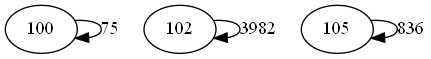

In [144]:
# Filter rows from all_info that have Task Ids in test_df
filtered_all_info = all_info[all_info['Task Id'].isin(test_df['Task Id'].unique())]

# Sort by 'Task Id' and 'Task arrival date' to maintain order of activities
filtered_all_info = filtered_all_info.sort_values(by=['Task Id', 'Task arrival date'])

# Create a DataFrame to store directly follows relations
df_follows = pd.DataFrame(columns=['From', 'To'])

# Identify directly follows relationships
for task_id in filtered_all_info['Task Id'].unique():
    task_activities = filtered_all_info[filtered_all_info['Task Id'] == task_id]
    for i in range(len(task_activities) - 1):
        from_activity = task_activities.iloc[i]['Actvity ID']
        to_activity = task_activities.iloc[i + 1]['Actvity ID']
        new_row = pd.DataFrame({'From': [from_activity], 'To': [to_activity]})
        df_follows = pd.concat([df_follows, new_row], ignore_index=True)

# Group by 'From' and 'To' to count occurrences
df_follows = df_follows.groupby(['From', 'To']).size().reset_index(name='Count')

# Create a new directed graph
dot = Digraph()

# Add nodes and edges to the graph
for _, row in df_follows.iterrows():
    from_activity = str(row['From'])  # Convert to string for node labels
    to_activity = str(row['To'])      # Convert to string for node labels
    count = row['Count']
    
    # Add nodes (activities)
    dot.node(from_activity, from_activity)
    dot.node(to_activity, to_activity)
    
    # Add edges with labels showing the count
    dot.edge(from_activity, to_activity, label=str(count))

# Render the graph to a file and display it inline
output_file_path = 'directly_follows_graph'
dot.render(output_file_path, format='png')

# Display the image inline
display(Image(filename=output_file_path + '.png'))

- Rows with 102, 100 and 105 as final activities do not make sense in our context. Thus these are activities that as we see in the graphs above are in a loop, in these case of unknown targets.

Now let's analyse the rest of the activities.

In [145]:
# Filter rows where the activity ID is either 107, 103, or 101
activity_rows = unknown_rows[unknown_rows['Actvity ID'].isin([101, 103, 107])]

# Display the rows where the activity ID is either 107, 103, or 101
print("Rows where the activity ID is either 107, 103, or 101:")
activity_rows

Rows where the activity ID is either 107, 103, or 101:


,Task Id,Request Identifier,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Actvity ID,Task Executer,Task executer department,Task Type,Action,idBPMApplicationAction,Sex,Role ID,Is Manager,OrgUnitSince,IsOutSourcer,idField,Value,Rejections,Year,Month,Age,Time Difference,Target
254,1716129,255,2022-05-15 11:45:06.960,2022-05-15 12:23:05.593,2022-05-15 12:23:55.537,2022-05-16 15:30:00.043,103,10606,0,1,6,273,0,11,1,2023,0,203,2022-05-08T23:00:00.000Z,0,2022,5,49,0,Unknown
406,1722381,407,2022-05-17 12:42:51.900,2022-05-17 14:29:26.117,2022-05-17 14:32:06.393,2022-05-18 10:42:51.950,103,10606,0,1,6,273,0,11,1,2023,0,3486,30,0,2022,5,49,0,Unknown
471,1716134,472,2022-05-15 11:57:39.470,2022-05-15 12:27:54.273,2022-05-15 12:29:05.420,2022-05-16 15:30:00.513,103,10606,0,1,6,273,0,11,1,2023,0,3486,30,0,2022,5,49,0,Unknown
585,1761039,586,2022-05-29 14:05:37.730,2022-05-29 19:45:06.267,2022-05-29 19:47:21.840,2022-05-30 15:30:00.827,103,10606,0,1,6,273,0,11,1,2023,0,3390,50,0,2022,5,49,0,Unknown
634,1719398,635,2022-05-16 15:40:42.583,2022-05-16 15:53:37.460,2022-05-16 15:55:07.140,2022-05-17 13:40:42.650,103,10925,0,1,6,273,0,8,1,2022,0,1604,90,0,2022,5,53,0,Unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45395,6547416,45408,2024-03-19 12:21:01.573,2024-03-19 12:27:04.007,2024-03-19 13:18:34.177,2024-03-25 16:21:01.620,101,707,636,3,5,290,0,3,1,2018,0,3486,30,0,2024,3,43,0,Unknown
45440,6556647,45453,2024-03-20 11:07:11.703,2024-03-20 11:08:25.533,2024-03-20 11:08:51.773,2024-03-26 15:07:11.780,101,9296,175,3,5,290,0,5,1,2021,0,3391,70,0,2024,3,50,0,Unknown
45513,6571574,45526,2024-03-22 09:09:21.253,2024-03-22 09:14:43.027,2024-03-22 09:35:15.727,2024-03-28 13:09:21.347,107,6869,734,2,5,290,0,5,1,2019,0,3391,70,0,2024,3,60,0,Unknown
45673,6606525,45686,2024-03-26 18:00:38.433,2024-03-26 18:07:11.093,2024-03-27 08:35:53.077,2024-04-03 12:30:00.527,101,706,357,3,5,290,0,5,1,2023,0,3486,50,0,2024,3,47,0,Unknown


In [146]:
activity_rows['idBPMApplicationAction'].unique()

array([273, 290, 300, 272])

In [147]:
# Group by 'idBPMApplicationAction' and aggregate the related activity IDs
action_activity_mapping = activity_rows.groupby('idBPMApplicationAction')['Actvity ID'].unique()

# Display the mapping of activity IDs for each 'idBPMApplicationAction'
print("Mapping of activity IDs for each 'idBPMApplicationAction':")
print(action_activity_mapping)

Mapping of activity IDs for each 'idBPMApplicationAction':
idBPMApplicationAction
272         [101]
273         [103]
290    [107, 101]
300         [103]
Name: Actvity ID, dtype: object


- Rows with 101, 103 and 107 show paths that when looking to the process design don't make much sense.

Having done this analyse, we will remove these instances that have unknown target.

##### Remove rows with Target 'Unknown'

In [148]:
# Remove rows where the target is 'Unknown'
all_info = all_info[all_info['Target'] != 'Unknown']
all_info

,Task Id,Request Identifier,Task arrival date,Task capture date,Task execution end date,Task predicted end date,Actvity ID,Task Executer,Task executer department,Task Type,Action,idBPMApplicationAction,Sex,Role ID,Is Manager,OrgUnitSince,IsOutSourcer,idField,Value,Rejections,Year,Month,Age,Time Difference,Target
0,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,100,7638,569,0,0,270,1,5,1,2021,0,1602,1,0,2022,4,57,0,Request finished
1,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,100,7638,569,0,0,270,1,5,1,2021,0,47,1,0,2022,4,57,0,Request finished
2,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,100,7638,569,0,0,270,1,5,1,2021,0,3486,10,0,2022,4,57,0,Request finished
3,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,100,7638,569,0,0,270,1,5,1,2021,0,3491,10,0,2022,4,57,0,Request finished
4,1584303,1,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,2022-04-11 16:02:13.820,100,7638,569,0,0,270,1,5,1,2021,0,3388,10,0,2022,4,57,0,Request finished
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1251308,6863412,45772,2024-05-07 08:31:29.010,2024-05-07 08:50:29.990,2024-05-07 08:50:59.667,2024-05-13 12:31:29.097,107,2243,722,2,3,299,0,4,1,2023,0,203,2024-05-01T23:00:00.000Z,0,2024,5,25,0,Request finished
1251309,6863412,45772,2024-05-07 08:31:29.010,2024-05-07 08:50:29.990,2024-05-07 08:50:59.667,2024-05-13 12:31:29.097,107,2243,722,2,3,299,0,4,1,2023,0,3486,30,0,2024,5,25,0,Request finished
1251310,6863412,45772,2024-05-07 08:31:29.010,2024-05-07 08:50:29.990,2024-05-07 08:50:59.667,2024-05-13 12:31:29.097,107,2243,722,2,3,299,0,4,1,2023,0,3388,50,0,2024,5,25,0,Request finished
1251311,6863412,45772,2024-05-07 08:31:29.010,2024-05-07 08:50:29.990,2024-05-07 08:50:59.667,2024-05-13 12:31:29.097,107,2243,722,2,3,299,0,4,1,2023,0,3390,50,0,2024,5,25,0,Request finished


## Analyze which activities proceed each 'dBPMApplicationAction' (Action code)

In [149]:
all_info['idBPMApplicationAction'].unique()

array([ 270,  273,  282,  299,  290, 8888,  888,  278,  271,  272, 2981,
        300,  298,  301,  274,  279,  275,  777, 2982])

In [150]:
all_info['Actvity ID'].unique()

array([100, 102, 103, 104, 107, 105, 106, 101, 108])

In [151]:
# Sort by Task arrival date to ensure chronological order
all_info_sorted = all_info.sort_values(by='Task arrival date')

# Group by 'idBPMApplicationAction' to find preceding activities
all_info_sorted['Previous Activity'] = all_info_sorted.groupby('idBPMApplicationAction')['Actvity ID'].shift(1)

# Display results
all_info_sorted = all_info_sorted[['Actvity ID', 'idBPMApplicationAction', 'Previous Activity']]
all_info_sorted

,Actvity ID,idBPMApplicationAction,Previous Activity
0,100,270,NaN
1,100,270,100.0
2,100,270,100.0
3,100,270,100.0
4,100,270,100.0
...,...,...,...
1251307,107,299,107.0
1251308,107,299,107.0
1251309,107,299,107.0
1251310,107,299,107.0


In [152]:
# drop duplicated rows 
all_info_sorted = all_info_sorted.drop_duplicates()
all_info_sorted.duplicated().sum()

0

In [153]:
all_info_sorted

,Actvity ID,idBPMApplicationAction,Previous Activity
0,100,270,NaN
1,100,270,100.0
17,102,273,NaN
16,102,273,102.0
26,103,273,102.0
...,...,...,...
1024651,103,2982,103.0
829673,107,8888,104.0
829676,107,8888,107.0
1205146,101,290,103.0


#### Filter actions with previous activity

We did this analyse, switching the action code, in order to better understand the process and the process map itself.

In [154]:
all_info['Rejections'] = all_info['Rejections'].astype('object')

In [155]:
# Display rows where 'Actvity ID' is 100
info299 = all_info_sorted[(all_info_sorted['idBPMApplicationAction'] == 278)]
info299

,Actvity ID,idBPMApplicationAction,Previous Activity
973,103,278,NaN
978,103,278,103.0
35476,107,278,103.0
35475,107,278,107.0
34045,103,278,107.0


#### With next activity

We did this analyse, switching the action code, in order to better understand the process and the process map itself.

In [156]:
# Remove duplicates based on 'Task arrival date', 'Activity ID', and 'Action'
df_unique = all_info.drop_duplicates()

# Sort by 'Task arrival date'
df_sorted = df_unique.sort_values(by='Task arrival date')

# Determine the next activity for each action
df_sorted['Next Activity'] = df_sorted['Actvity ID'].shift(-1)

# Display results
df_sorted = df_sorted[['Actvity ID', 'idBPMApplicationAction', 'Next Activity']]

# drop duplicated rows 
df_sorted = df_sorted.drop_duplicates()
df_sorted.duplicated().sum()
df_sorted

,Actvity ID,idBPMApplicationAction,Next Activity
0,100,270,100.0
8,100,270,102.0
17,102,273,102.0
12,102,273,103.0
26,103,273,103.0
...,...,...,...
1072060,101,2981,105.0
1162039,101,298,105.0
1167908,103,290,101.0
1203302,106,290,104.0


In [157]:
# Display rows where 'Actvity ID' is 100
df_100= df_sorted[(df_sorted['Actvity ID'] == 100)]
df_100

,Actvity ID,idBPMApplicationAction,Next Activity
0,100,270,100.0
8,100,270,102.0
581,100,270,104.0
766,100,270,105.0
2801,100,270,103.0
13107,100,270,107.0
32942,100,270,101.0
297935,100,270,108.0
373025,100,270,106.0


In [158]:
# Display rows where 'Actvity ID' is 100
df_101 = df_sorted[(df_sorted['idBPMApplicationAction'] == 299)]
df_101

,Actvity ID,idBPMApplicationAction,Next Activity
79,107,299,107.0
76,107,299,100.0
871,107,299,102.0
1101,107,299,103.0
9149,107,299,104.0
15774,107,299,101.0
89499,107,299,106.0
95995,107,299,105.0
286210,107,299,108.0
1251312,107,299,NaN


## Feature Selection

Some of these features were removed  looking at the correlation matrix and comments existent on the Profiling Report, others were selected based on our understanding of the problem.

In [159]:
all_info.drop(['Task Id', 'Task arrival date', 'Task capture date', 'Task predicted end date', 
               'Task Executer', 'Task executer department', 'Role ID', 
               'OrgUnitSince', 'idField', 'Value', 'Rejections', 'Action' ], axis=1, inplace=True)

In [160]:
all_info

,Request Identifier,Task execution end date,Actvity ID,Task Type,idBPMApplicationAction,Sex,Is Manager,IsOutSourcer,Year,Month,Age,Time Difference,Target
0,1,2022-04-11 16:02:13.820,100,0,270,1,1,0,2022,4,57,0,Request finished
1,1,2022-04-11 16:02:13.820,100,0,270,1,1,0,2022,4,57,0,Request finished
2,1,2022-04-11 16:02:13.820,100,0,270,1,1,0,2022,4,57,0,Request finished
3,1,2022-04-11 16:02:13.820,100,0,270,1,1,0,2022,4,57,0,Request finished
4,1,2022-04-11 16:02:13.820,100,0,270,1,1,0,2022,4,57,0,Request finished
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1251308,45772,2024-05-07 08:50:59.667,107,2,299,0,1,0,2024,5,25,0,Request finished
1251309,45772,2024-05-07 08:50:59.667,107,2,299,0,1,0,2024,5,25,0,Request finished
1251310,45772,2024-05-07 08:50:59.667,107,2,299,0,1,0,2024,5,25,0,Request finished
1251311,45772,2024-05-07 08:50:59.667,107,2,299,0,1,0,2024,5,25,0,Request finished


In [161]:
all_info.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1229015 entries, 0 to 1251312
Data columns (total 13 columns):
 #   Column                   Non-Null Count    Dtype         
---  ------                   --------------    -----         
 0   Request Identifier       1229015 non-null  int32         
 1   Task execution end date  1229015 non-null  datetime64[ns]
 2   Actvity ID               1229015 non-null  int32         
 3   Task Type                1229015 non-null  object        
 4   idBPMApplicationAction   1229015 non-null  int32         
 5   Sex                      1229015 non-null  object        
 6   Is Manager               1229015 non-null  object        
 7   IsOutSourcer             1229015 non-null  object        
 8   Year                     1229015 non-null  int32         
 9   Month                    1229015 non-null  int32         
 10  Age                      1229015 non-null  int32         
 11  Time Difference          1229015 non-null  int64         
 12  Targe

In [162]:
# Check duplicate values
all_info.duplicated().sum()

1044470

In [163]:
# drop duplicated rows 
all_info = all_info.drop_duplicates()
all_info

,Request Identifier,Task execution end date,Actvity ID,Task Type,idBPMApplicationAction,Sex,Is Manager,IsOutSourcer,Year,Month,Age,Time Difference,Target
0,1,2022-04-11 16:02:13.820,100,0,270,1,1,0,2022,4,57,0,Request finished
9,1,2022-04-12 10:02:54.687,102,1,273,0,0,1,2022,4,57,0,Request finished
18,1,2022-04-12 10:17:16.050,103,1,273,0,1,0,2022,4,49,0,Request finished
27,1,2022-05-10 13:43:32.203,104,1,282,1,1,0,2022,4,57,28,Request finished
36,1,2022-05-10 13:48:44.353,107,2,299,1,1,0,2022,5,57,0,Request finished
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1251268,45772,2024-05-03 16:42:52.420,102,1,273,0,1,0,2024,5,49,0,Request finished
1251277,45772,2024-05-03 17:44:40.083,103,1,300,0,1,0,2024,5,49,0,Request finished
1251286,45772,2024-05-06 09:11:24.433,104,1,290,0,1,0,2024,5,25,2,Request finished
1251295,45772,2024-05-07 08:31:28.600,104,1,282,0,1,0,2024,5,48,0,Request finished


Since the predictive models were only trained based on the extracted paths and their prefixes, there was no need to use these variables.

# Continue on Group_F_Case4_Code2_Modeling notebook for:
In the following notebook the following steps were made:
- Extract paths
- Frequency-based encoding
- Creating dataframes for each path
- Scaler (standard scaler)
- Train-test split
- Modeling
- Deployment

Save the dataframe in a CSV file, to be open in the second notebook 

In [164]:
# Save DataFrame to CSV file
all_info.to_csv('all_info.csv', index=False)